In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
%config InlineBackend.figure_format='retina'

# load open data

In [2]:
hcp_open_data = r'E:\gregn\data\HCP\HCP_OPEN.h5'
hcp_open = pd.read_hdf(hcp_open_data, 'hcp_open')
hcp_open = hcp_open.set_index(['Subject'])
print('HCP OPEN\nrows: {}\ncols:  {}'.format(hcp_open.shape[0], hcp_open.shape[1]))
print('\ndata type value counts:')
print(hcp_open.dtypes.value_counts())

HCP OPEN
rows: 1206
cols:  581

data type value counts:
float64    427
object      78
bool        48
int64       28
dtype: int64


# load restricted data

In [3]:
hcp_restricted_data = r'E:\gregn\data\HCP\HCP_RESTRICTED.h5'
hcp_restricted = pd.read_hdf(hcp_restricted_data, 'hcp_restricted')
hcp_restricted = hcp_restricted.set_index(['Subject'])
print('HCP RESTRICTED\nrows: {}\ncols:  {}'.format(hcp_restricted.shape[0], hcp_restricted.shape[1]))
print('\ndata type value counts:')
print(hcp_restricted.dtypes.value_counts())

HCP RESTRICTED
rows: 1206
cols:  200

data type value counts:
float64    177
bool         9
object       8
int64        6
dtype: int64


In [4]:
hcp_restricted = hcp_restricted[['Family_ID', 'SSAGA_Mj_Ab_Dep']]

# join data

In [5]:
hcp = hcp_open.join(hcp_restricted)
print('HCP \nrows: {}\ncols:  {}'.format(hcp.shape[0], hcp.shape[1]))
print('\ndata type value counts:')
print(hcp.dtypes.value_counts())

HCP 
rows: 1206
cols:  583

data type value counts:
float64    428
object      79
bool        48
int64       28
dtype: int64


In [6]:
hcp = hcp.dropna(subset=['FS_IntraCranial_Vol'])

# y target variable

In [7]:
hcp = hcp.dropna(subset=['SSAGA_Mj_Ab_Dep'])

y = hcp['SSAGA_Mj_Ab_Dep'].values
print('marijuana dependence class counts:\n')
print(hcp['SSAGA_Mj_Ab_Dep'].value_counts())

marijuana dependence class counts:

0.0    1009
1.0     102
Name: SSAGA_Mj_Ab_Dep, dtype: int64


# X features

In [8]:
X = hcp
X = X[[
 'FS_IntraCranial_Vol',
 'FS_BrainSeg_Vol',
 'FS_BrainSeg_Vol_No_Vent',
 'FS_BrainSeg_Vol_No_Vent_Surf',
 'FS_LCort_GM_Vol',
 'FS_RCort_GM_Vol',
 'FS_TotCort_GM_Vol',
 'FS_SubCort_GM_Vol',
 'FS_Total_GM_Vol',
 'FS_SupraTentorial_Vol',
 'FS_L_WM_Vol',
 'FS_R_WM_Vol',
 'FS_Tot_WM_Vol',
 'FS_Mask_Vol',
 'FS_BrainSegVol_eTIV_Ratio',
 'FS_MaskVol_eTIV_Ratio',
 'FS_LH_Defect_Holes',
 'FS_RH_Defect_Holes',
 'FS_Total_Defect_Holes',
 'FS_L_LatVent_Vol',
 'FS_L_InfLatVent_Vol',
 'FS_L_Cerebellum_WM_Vol',
 'FS_L_Cerebellum_Cort_Vol',
 'FS_L_ThalamusProper_Vol',
 'FS_L_Caudate_Vol',
 'FS_L_Putamen_Vol',
 'FS_L_Pallidum_Vol',
 'FS_3rdVent_Vol',
 'FS_4thVent_Vol',
 'FS_BrainStem_Vol',
 'FS_L_Hippo_Vol',
 'FS_L_Amygdala_Vol',
 'FS_CSF_Vol',
 'FS_L_AccumbensArea_Vol',
 'FS_L_VentDC_Vol',
 'FS_L_Vessel_Vol',
 'FS_L_ChoroidPlexus_Vol',
 'FS_R_LatVent_Vol',
 'FS_R_InfLatVent_Vol',
 'FS_R_Cerebellum_WM_Vol',
 'FS_R_Cerebellum_Cort_Vol',
 'FS_R_ThalamusProper_Vol',
 'FS_R_Caudate_Vol',
 'FS_R_Putamen_Vol',
 'FS_R_Pallidum_Vol',
 'FS_R_Hippo_Vol',
 'FS_R_Amygdala_Vol',
 'FS_R_AccumbensArea_Vol',
 'FS_R_VentDC_Vol',
 'FS_R_Vessel_Vol',
 'FS_R_ChoroidPlexus_Vol',
 'FS_5thVent_Vol',
 'FS_WM_Hypointens_Vol',
 'FS_L_WM_Hypointens_Vol',
 'FS_R_WM_Hypointens_Vol',
 'FS_L_Non-WM_Hypointens_Vol',
 'FS_R_Non-WM_Hypointens_Vol',
 'FS_OpticChiasm_Vol',
 'FS_CC_Posterior_Vol',
 'FS_CC_MidPosterior_Vol',
 'FS_CC_Central_Vol',
 'FS_CC_MidAnterior_Vol',
 'FS_CC_Anterior_Vol',
 'FS_L_Bankssts_Thck',
 'FS_L_Caudalanteriorcingulate_Thck',
 'FS_L_Caudalmiddlefrontal_Thck',
 'FS_L_Cuneus_Thck',
 'FS_L_Entorhinal_Thck',
 'FS_L_Fusiform_Thck',
 'FS_L_Inferiorparietal_Thck',
 'FS_L_Inferiortemporal_Thck',
 'FS_L_Isthmuscingulate_Thck',
 'FS_L_Lateraloccipital_Thck',
 'FS_L_Lateralorbitofrontal_Thck',
 'FS_L_Lingual_Thck',
 'FS_L_Medialorbitofrontal_Thck',
 'FS_L_Middletemporal_Thck',
 'FS_L_Parahippocampal_Thck',
 'FS_L_Paracentral_Thck',
 'FS_L_Parsopercularis_Thck',
 'FS_L_Parsorbitalis_Thck',
 'FS_L_Parstriangularis_Thck',
 'FS_L_Pericalcarine_Thck',
 'FS_L_Postcentral_Thck',
 'FS_L_Posteriorcingulate_Thck',
 'FS_L_Precentral_Thck',
 'FS_L_Precuneus_Thck',
 'FS_L_Rostralanteriorcingulate_Thck',
 'FS_L_Rostralmiddlefrontal_Thck',
 'FS_L_Superiorfrontal_Thck',
 'FS_L_Superiorparietal_Thck',
 'FS_L_Superiortemporal_Thck',
 'FS_L_Supramarginal_Thck',
 'FS_L_Frontalpole_Thck',
 'FS_L_Temporalpole_Thck',
 'FS_L_Transversetemporal_Thck',
 'FS_L_Insula_Thck',
 'FS_R_Bankssts_Thck',
 'FS_R_Caudalanteriorcingulate_Thck',
 'FS_R_Caudalmiddlefrontal_Thck',
 'FS_R_Cuneus_Thck',
 'FS_R_Entorhinal_Thck',
 'FS_R_Fusiform_Thck',
 'FS_R_Inferiorparietal_Thck',
 'FS_R_Inferiortemporal_Thck',
 'FS_R_Isthmuscingulate_Thck',
 'FS_R_Lateraloccipital_Thck',
 'FS_R_Lateralorbitofrontal_Thck',
 'FS_R_Lingual_Thck',
 'FS_R_Medialorbitofrontal_Thck',
 'FS_R_Middletemporal_Thck',
 'FS_R_Parahippocampal_Thck',
 'FS_R_Paracentral_Thck',
 'FS_R_Parsopercularis_Thck',
 'FS_R_Parsorbitalis_Thck',
 'FS_R_Parstriangularis_Thck',
 'FS_R_Pericalcarine_Thck',
 'FS_R_Postcentral_Thck',
 'FS_R_Posteriorcingulate_Thck',
 'FS_R_Precentral_Thck',
 'FS_R_Precuneus_Thck',
 'FS_R_Rostralanteriorcingulate_Thck',
 'FS_R_Rostralmiddlefrontal_Thck',
 'FS_R_Superiorfrontal_Thck',
 'FS_R_Superiorparietal_Thck',
 'FS_R_Superiortemporal_Thck',
 'FS_R_Supramarginal_Thck',
 'FS_R_Frontalpole_Thck',
 'FS_R_Temporalpole_Thck',
 'FS_R_Transversetemporal_Thck',
 'FS_R_Insula_Thck',
 'FS_L_Bankssts_Area',
 'FS_L_Caudalanteriorcingulate_Area',
 'FS_L_Caudalmiddlefrontal_Area',
 'FS_L_Cuneus_Area',
 'FS_L_Entorhinal_Area',
 'FS_L_Fusiform_Area',
 'FS_L_Inferiorparietal_Area',
 'FS_L_Inferiortemporal_Area',
 'FS_L_Isthmuscingulate_Area',
 'FS_L_Lateraloccipital_Area',
 'FS_L_Lateralorbitofrontal_Area',
 'FS_L_Lingual_Area',
 'FS_L_Medialorbitofrontal_Area',
 'FS_L_Middletemporal_Area',
 'FS_L_Parahippocampal_Area',
 'FS_L_Paracentral_Area',
 'FS_L_Parsopercularis_Area',
 'FS_L_Parsorbitalis_Area',
 'FS_L_Parstriangularis_Area',
 'FS_L_Pericalcarine_Area',
 'FS_L_Postcentral_Area',
 'FS_L_Posteriorcingulate_Area',
 'FS_L_Precentral_Area',
 'FS_L_Precuneus_Area',
 'FS_L_Rostralanteriorcingulate_Area',
 'FS_L_Rostralmiddlefrontal_Area',
 'FS_L_Superiorfrontal_Area',
 'FS_L_Superiorparietal_Area',
 'FS_L_Superiortemporal_Area',
 'FS_L_Supramarginal_Area',
 'FS_L_Frontalpole_Area',
 'FS_L_Temporalpole_Area',
 'FS_L_Transversetemporal_Area',
 'FS_L_Insula_Area',
 'FS_R_Bankssts_Area',
 'FS_R_Caudalanteriorcingulate_Area',
 'FS_R_Caudalmiddlefrontal_Area',
 'FS_R_Cuneus_Area',
 'FS_R_Entorhinal_Area',
 'FS_R_Fusiform_Area',
 'FS_R_Inferiorparietal_Area',
 'FS_R_Inferiortemporal_Area',
 'FS_R_Isthmuscingulate_Area',
 'FS_R_Lateraloccipital_Area',
 'FS_R_Lateralorbitofrontal_Area',
 'FS_R_Lingual_Area',
 'FS_R_Medialorbitofrontal_Area',
 'FS_R_Middletemporal_Area',
 'FS_R_Parahippocampal_Area',
 'FS_R_Paracentral_Area',
 'FS_R_Parsopercularis_Area',
 'FS_R_Parsorbitalis_Area',
 'FS_R_Parstriangularis_Area',
 'FS_R_Pericalcarine_Area',
 'FS_R_Postcentral_Area',
 'FS_R_Posteriorcingulate_Area',
 'FS_R_Precentral_Area',
 'FS_R_Precuneus_Area',
 'FS_R_Rostralanteriorcingulate_Area',
 'FS_R_Rostralmiddlefrontal_Area',
 'FS_R_Superiorfrontal_Area',
 'FS_R_Superiorparietal_Area',
 'FS_R_Superiortemporal_Area',
 'FS_R_Supramarginal_Area',
 'FS_R_Frontalpole_Area',
 'FS_R_Temporalpole_Area',
 'FS_R_Transversetemporal_Area',
 'FS_R_Insula_Area', 
]]
print('number of subjects:  ', X.shape[0])
print('number of features:  ', X.shape[1])

number of subjects:   1111
number of features:   199


# load model

In [9]:
import pickle
from sklearn.externals import joblib

gs = joblib.load('hcp_dependence_gridsearch_freesurfer.pkl')
scores = joblib.load('hcp_dependence_nested_score_freesurfer.pkl')

print('scores:', scores)
print('average score:', scores.mean())
print('std:', scores.std())
print('\nbest estimator:\n\n', gs.best_estimator_)

scores: [0.56270627 0.645686   0.61930693 0.59108911 0.6420398 ]
average score: 0.6121656216794388
std: 0.03148817954191034

best estimator:

 XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, early_stopping_rounds=30, gamma=0,
       learning_rate=0.2, max_delta_step=0, max_depth=8,
       min_child_weight=1, missing=nan, n_estimators=10000, n_jobs=1,
       nthread=6, objective='binary:logistic', random_state=42,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=1, tree_method='auto')


# first tree

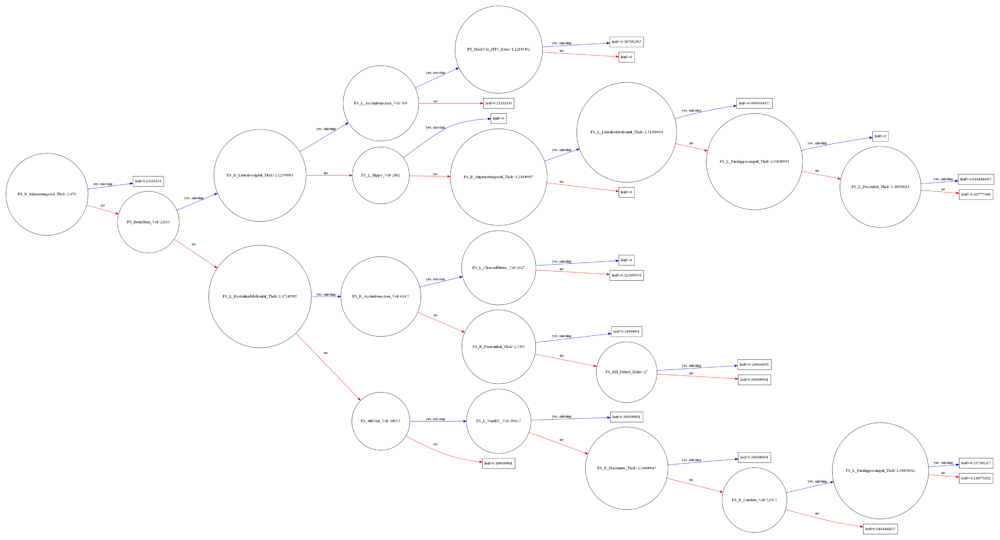

In [10]:
from xgboost import plot_tree
from matplotlib.pylab import rcParams
plt.style.use('default')
rcParams['figure.dpi'] = 200

plot_tree(gs.best_estimator_, num_trees=0, rankdir='LR')
fig = plt.gcf()
fig.set_size_inches(26.5,19)
plt.show()

# SHAP

In [11]:
import shap
shap.initjs()

numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.


In [12]:
explainer = shap.TreeExplainer(gs.best_estimator_)
shap_values = explainer.shap_values(X)

X_display, y_display = X, y

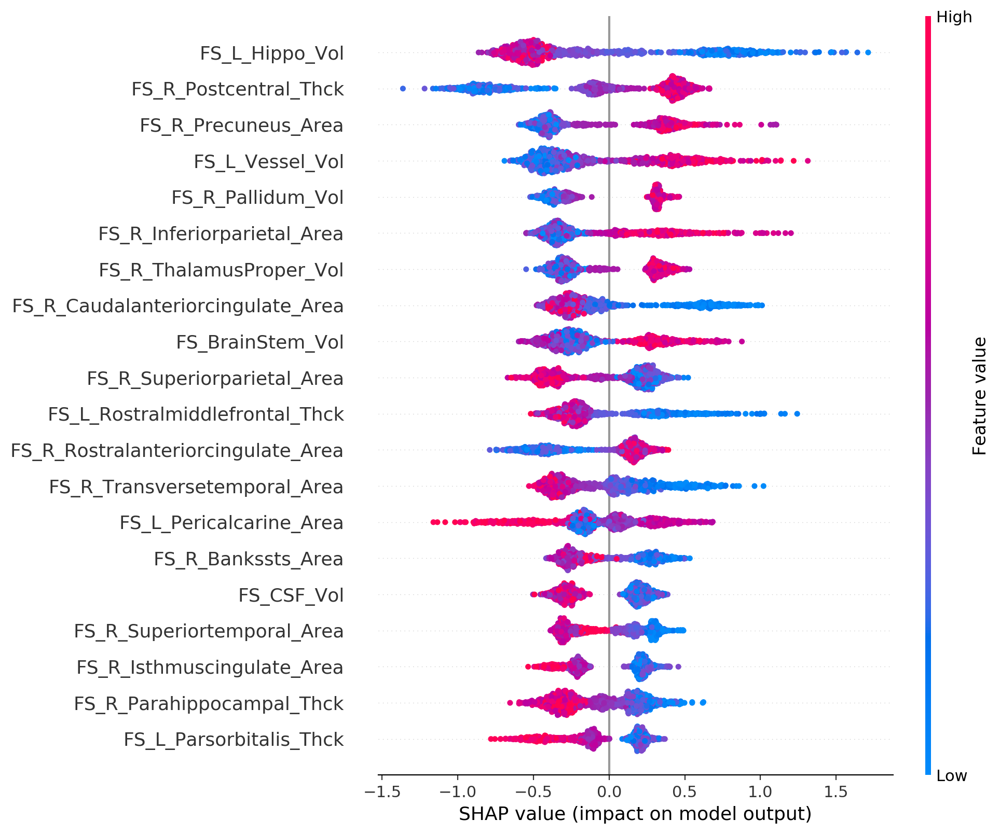

In [13]:
rcParams['figure.dpi'] = 120
plt.style.use('default')

shap.summary_plot(shap_values, X_display)

                                feature  importance       std
30                       FS_L_Hippo_Vol    0.540052  0.252413
117               FS_R_Postcentral_Thck    0.462889  0.289799
188                 FS_R_Precuneus_Area    0.396723  0.109750
35                      FS_L_Vessel_Vol    0.388533  0.166728
44                    FS_R_Pallidum_Vol    0.335254  0.057704
171          FS_R_Inferiorparietal_Area    0.332101  0.155855
41              FS_R_ThalamusProper_Vol    0.308760  0.077814
166   FS_R_Caudalanteriorcingulate_Area    0.302139  0.201125
29                     FS_BrainStem_Vol    0.300974  0.124195
192          FS_R_Superiorparietal_Area    0.292309  0.119022
88       FS_L_Rostralmiddlefrontal_Thck    0.280167  0.147218
189  FS_R_Rostralanteriorcingulate_Area    0.277116  0.160168
197        FS_R_Transversetemporal_Area    0.271323  0.164712
150             FS_L_Pericalcarine_Area    0.260121  0.208911
165                  FS_R_Bankssts_Area    0.249017  0.087100
32      

56           FS_R_Non-WM_Hypointens_Vol    0.000000  0.000000


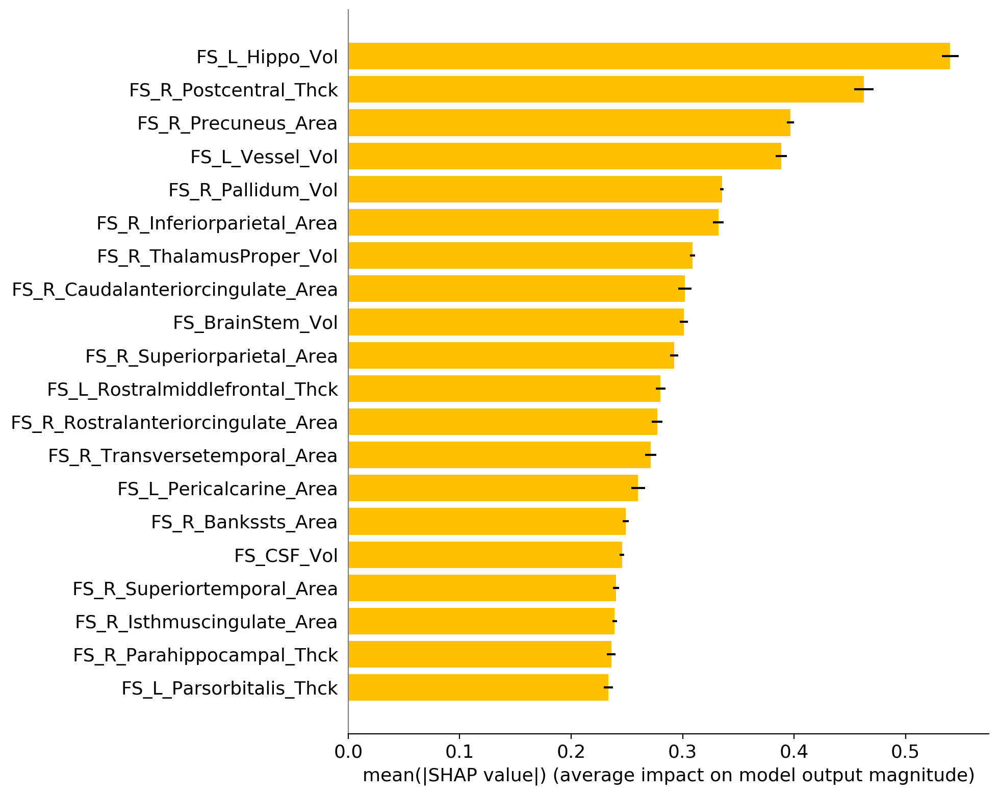

In [14]:
# feature importance
vals_mean= np.abs(shap_values).mean(0)
vals_std= np.abs(shap_values).std(0)

feature_importance = pd.DataFrame(list(zip(X.columns, vals_mean, vals_std)), 
                                  columns=['feature','importance', 'std'])
feature_importance.sort_values(by=['importance'], ascending=False, inplace=True)
with pd.option_context('display.max_rows', None):
    print(feature_importance)

    
# summary plot with standard error bars    
import math
matplotlib.rcParams.update({'font.size': 13})

feats = feature_importance['feature'][:20].reset_index()
means = np.array(feature_importance['importance'][:20])
stds = np.array(feature_importance['std'][:20])
y_pos =  np.arange(len(feats))

fig, ax = plt.subplots(figsize=(10,8))

ax.barh(y_pos, means, xerr=stds/math.sqrt(len(y)), align='center', color="#FFC000")
ax.set_yticks(y_pos)
ax.set_yticklabels(feats['feature'])
ax.invert_yaxis()
ax.set_xlabel('mean(|SHAP value|) (average impact on model output magnitude)')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('none')
ax.spines['left'].set_color('gray')
plt.tight_layout()
plt.show()

# SHAP dependence plots
# top 20

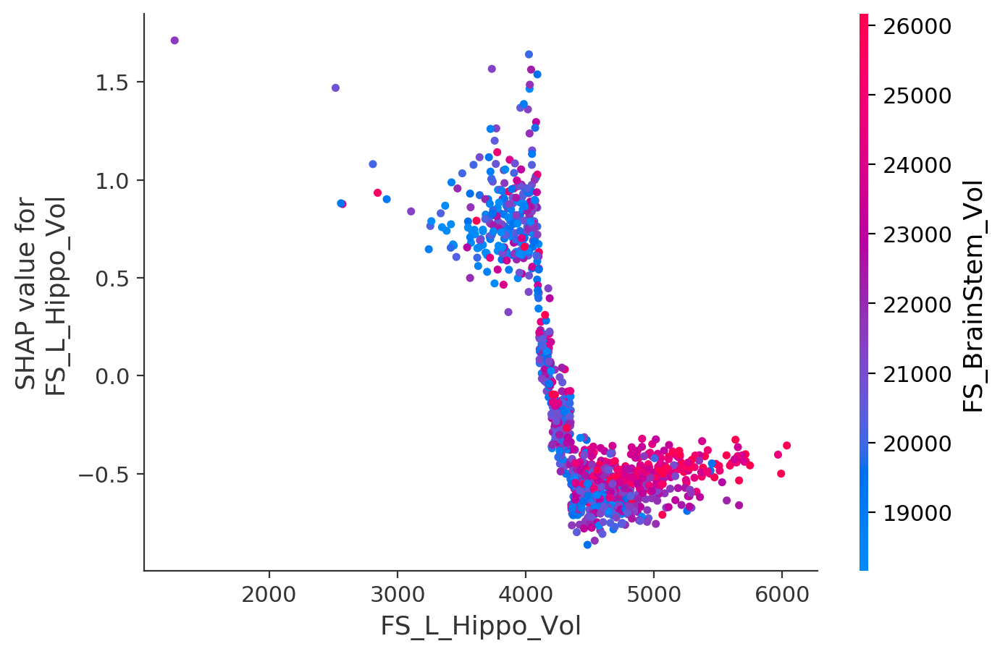

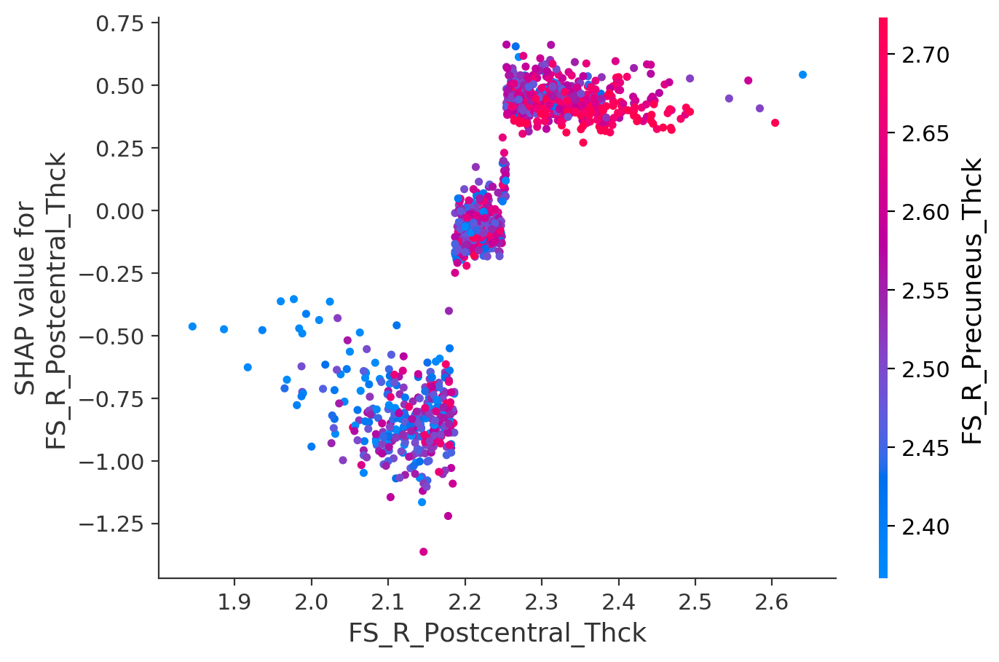

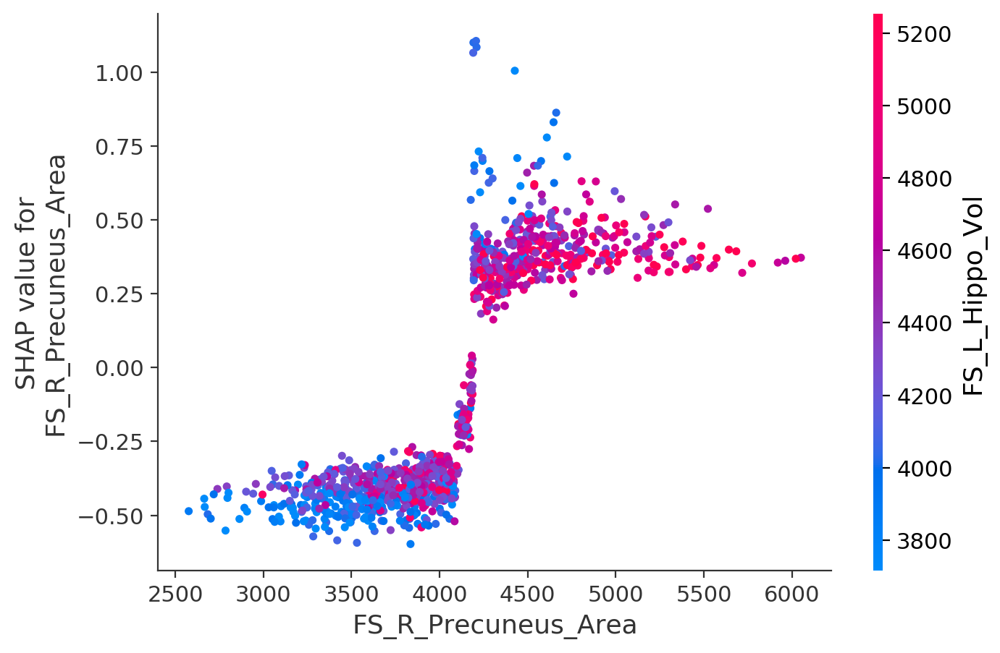

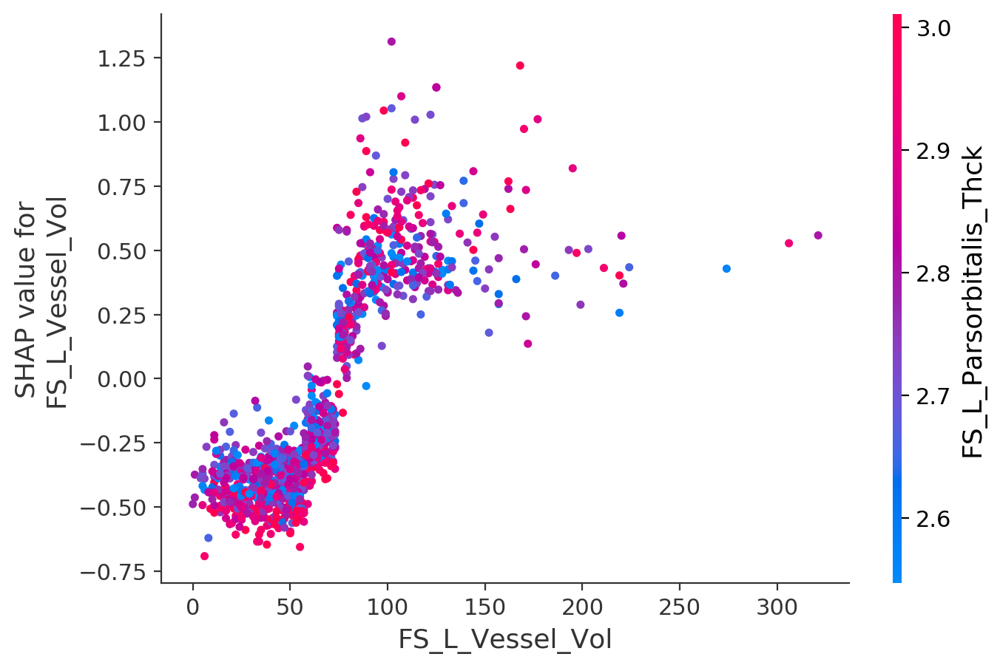

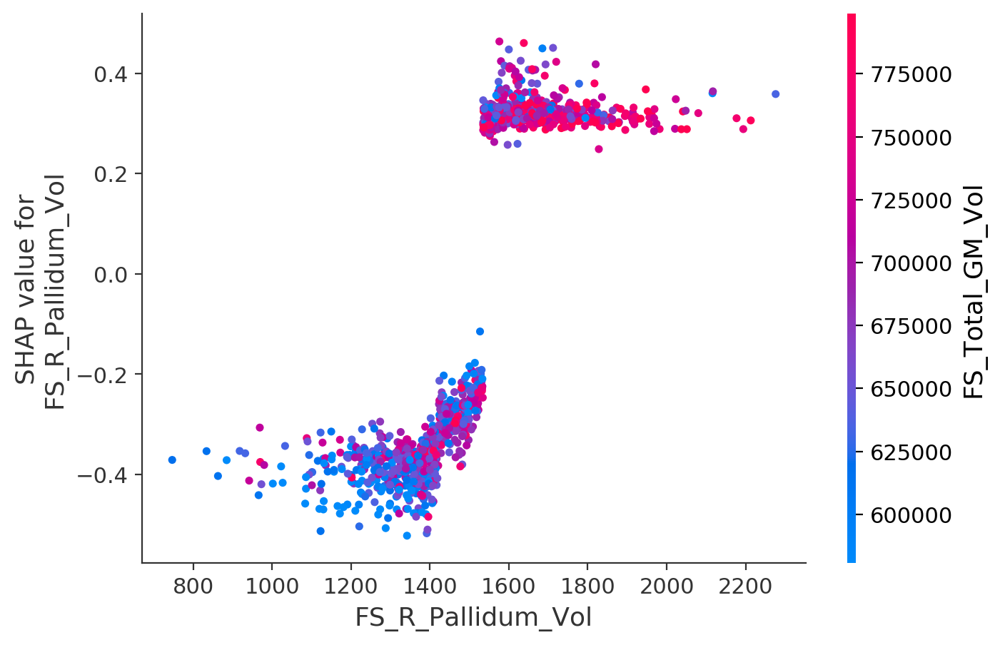

...

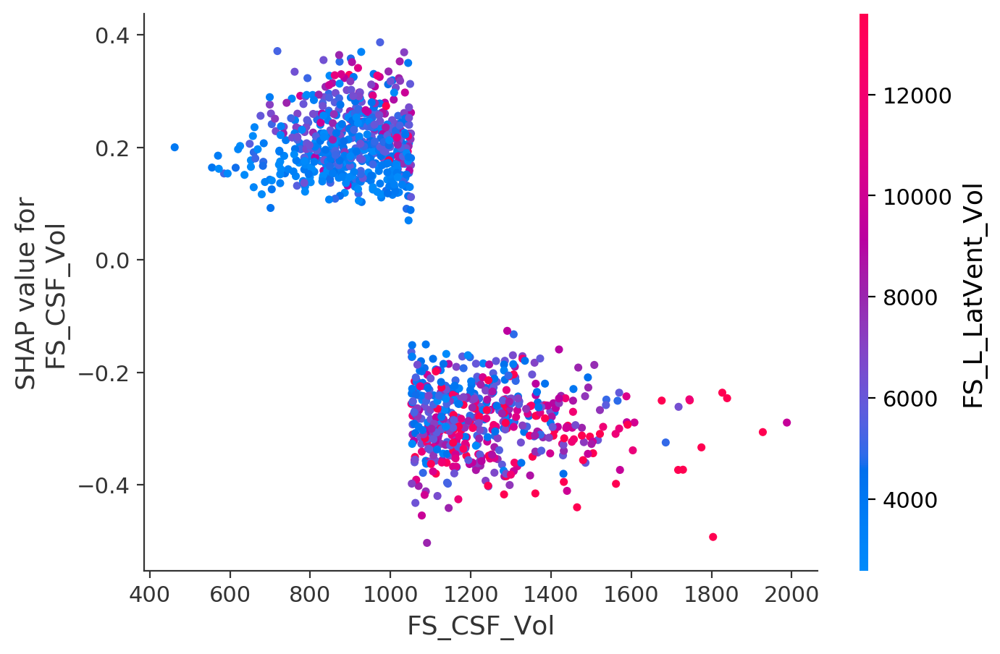

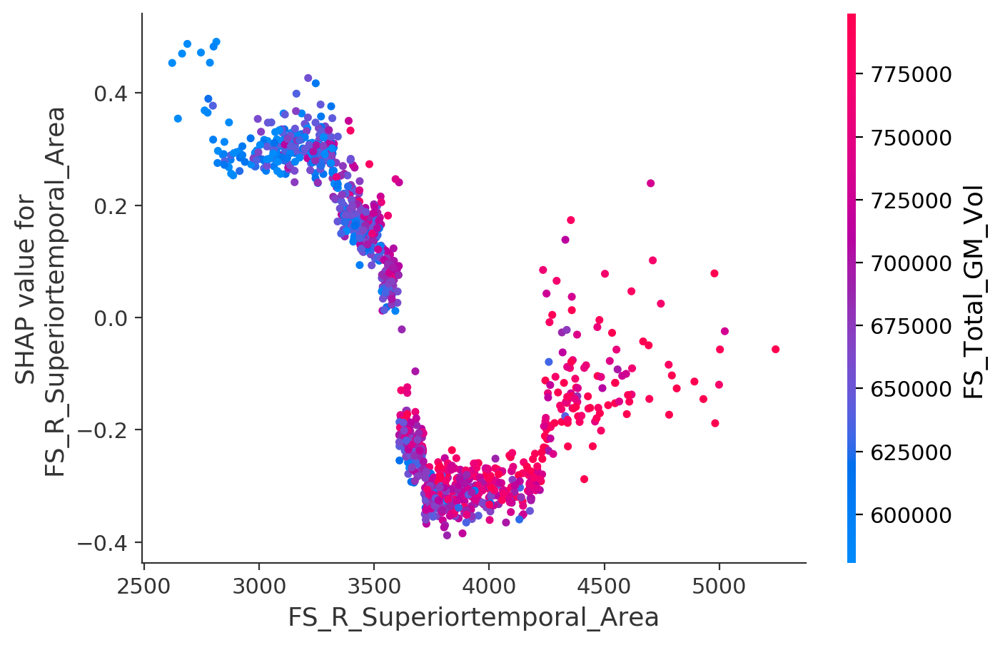

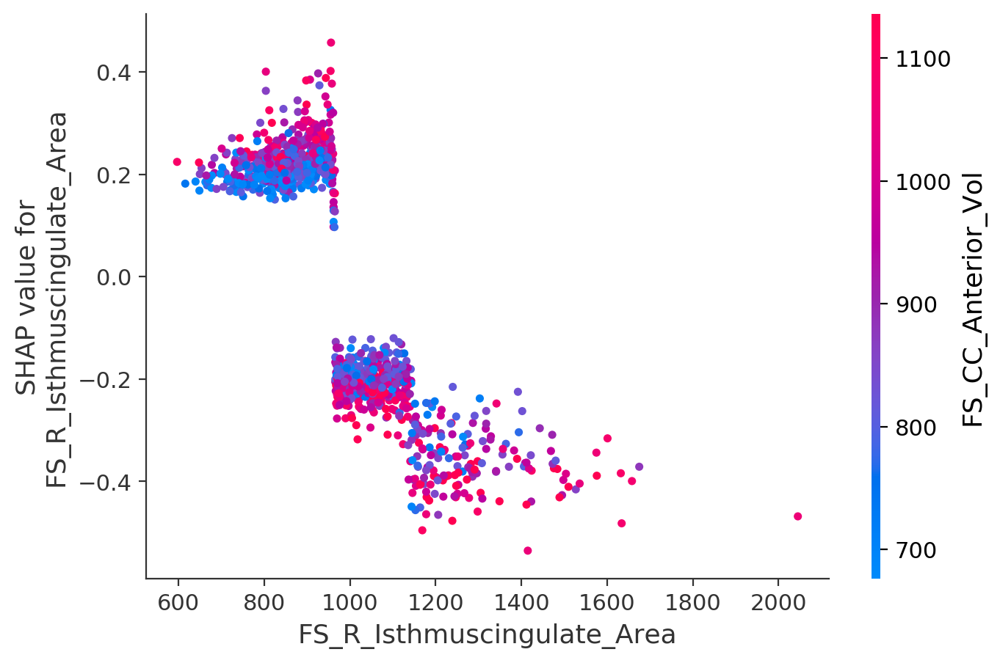

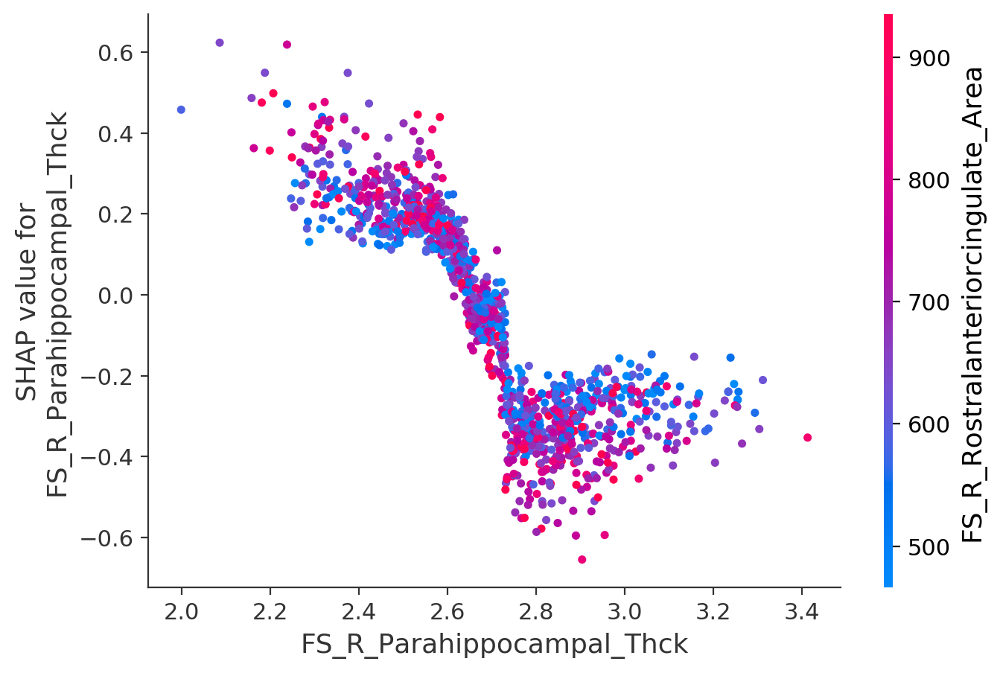

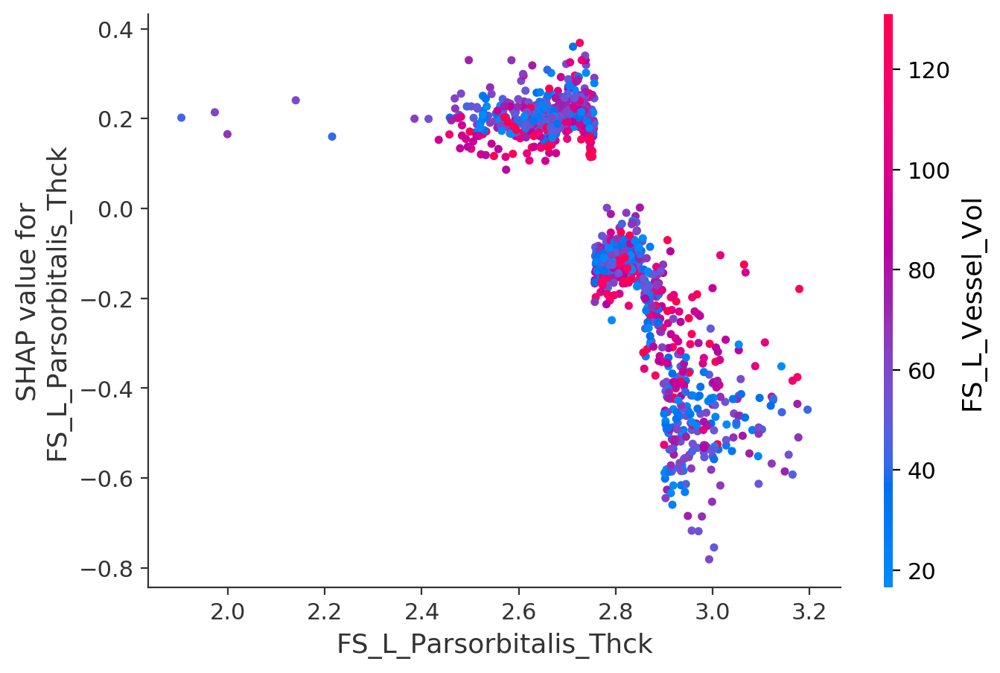

In [15]:
top_inds = np.argsort(-np.sum(np.abs(shap_values), 0))
for i in range(20):
    shap.dependence_plot(
        top_inds[i], 
        shap_values, 
        X, 
        display_features=X_display
    )

# SHAP interaction values

In [16]:
shap_interaction_values = shap.TreeExplainer(gs.best_estimator_).shap_interaction_values(X)
joblib.dump(shap_interaction_values, 'hcp_dependence_shap_interaction_values_freesurfer.pkl')

['hcp_dependence_shap_interaction_values_freesurfer.pkl']

# SHAP main effect value plots
# top 20

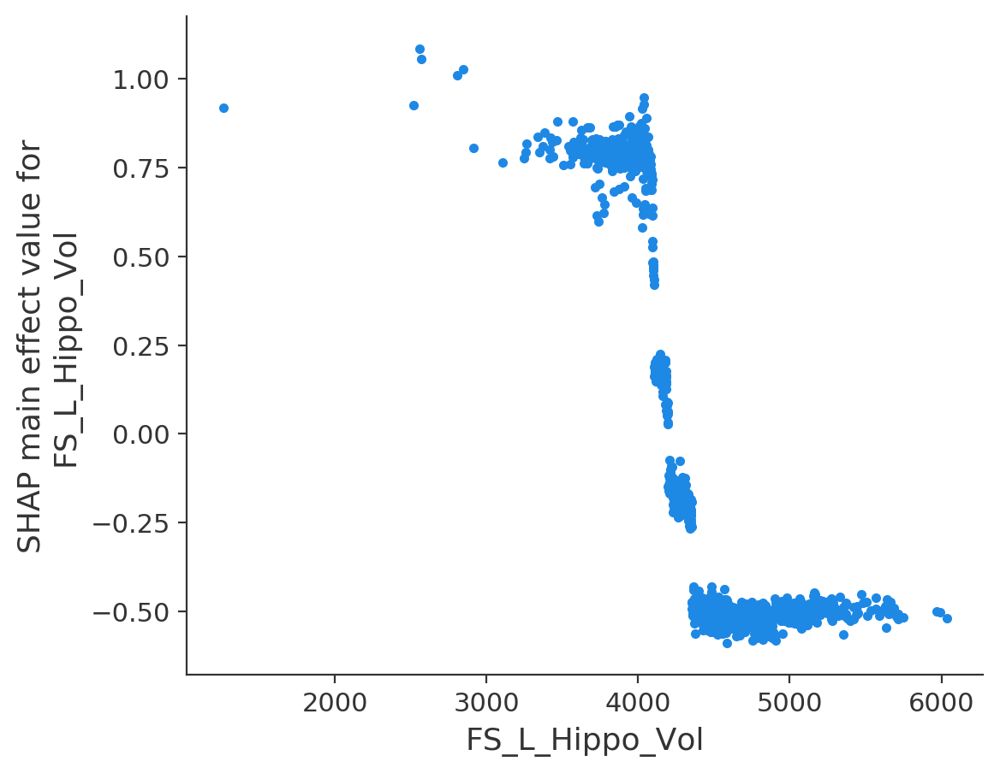

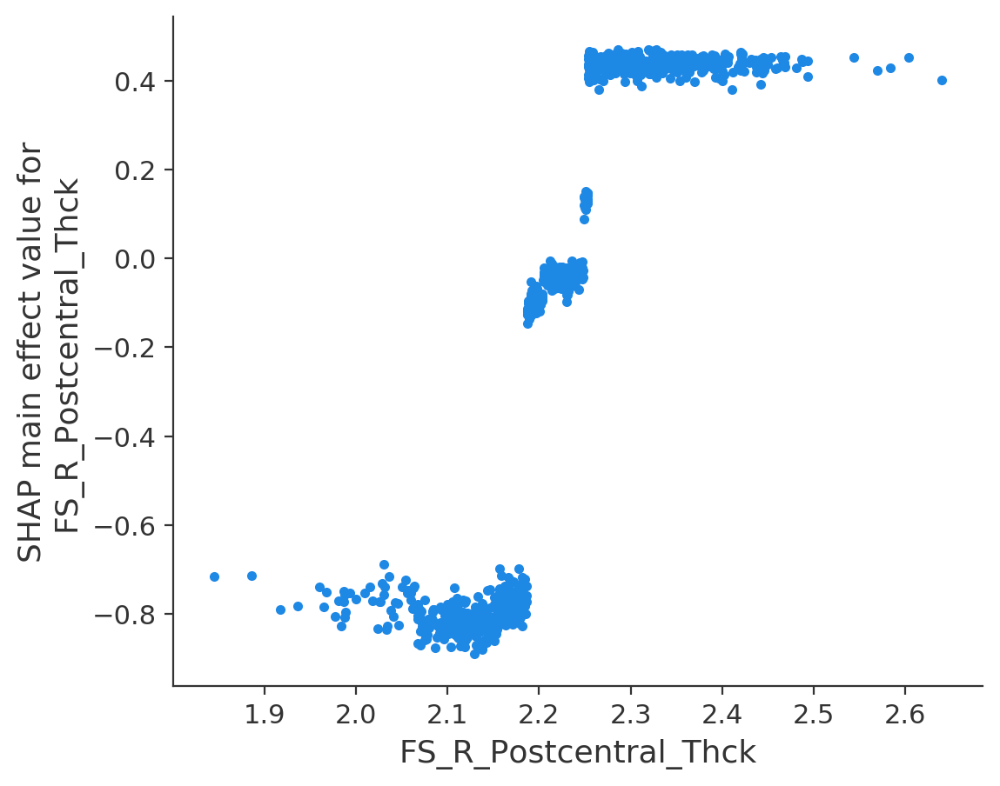

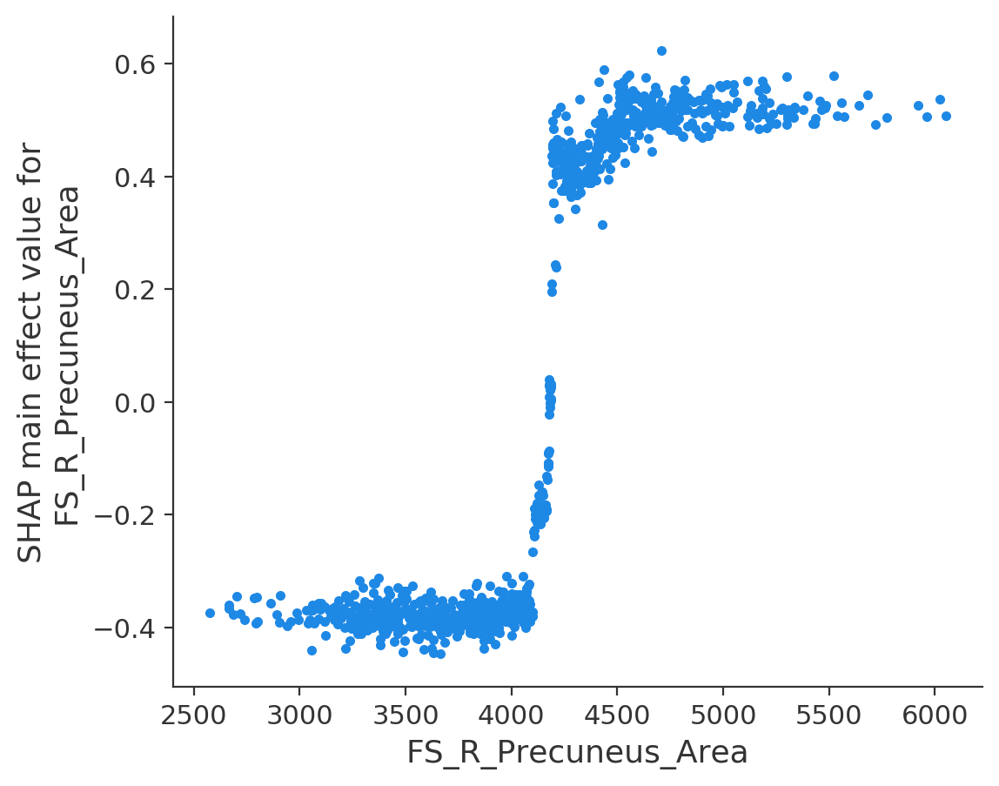

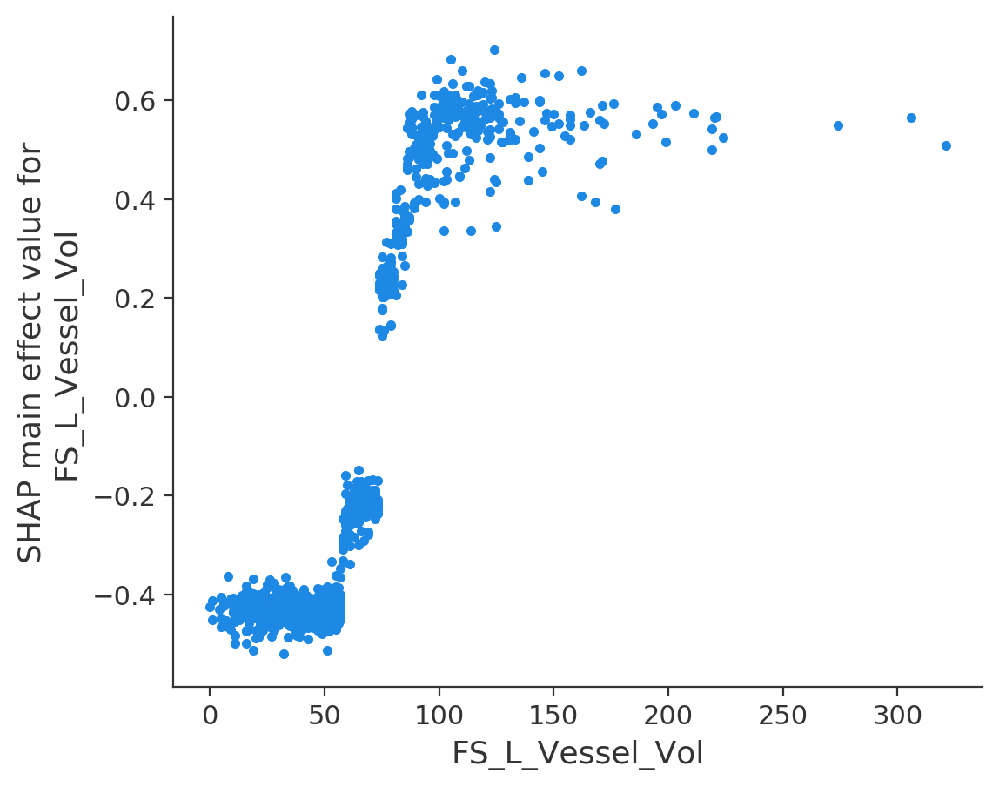

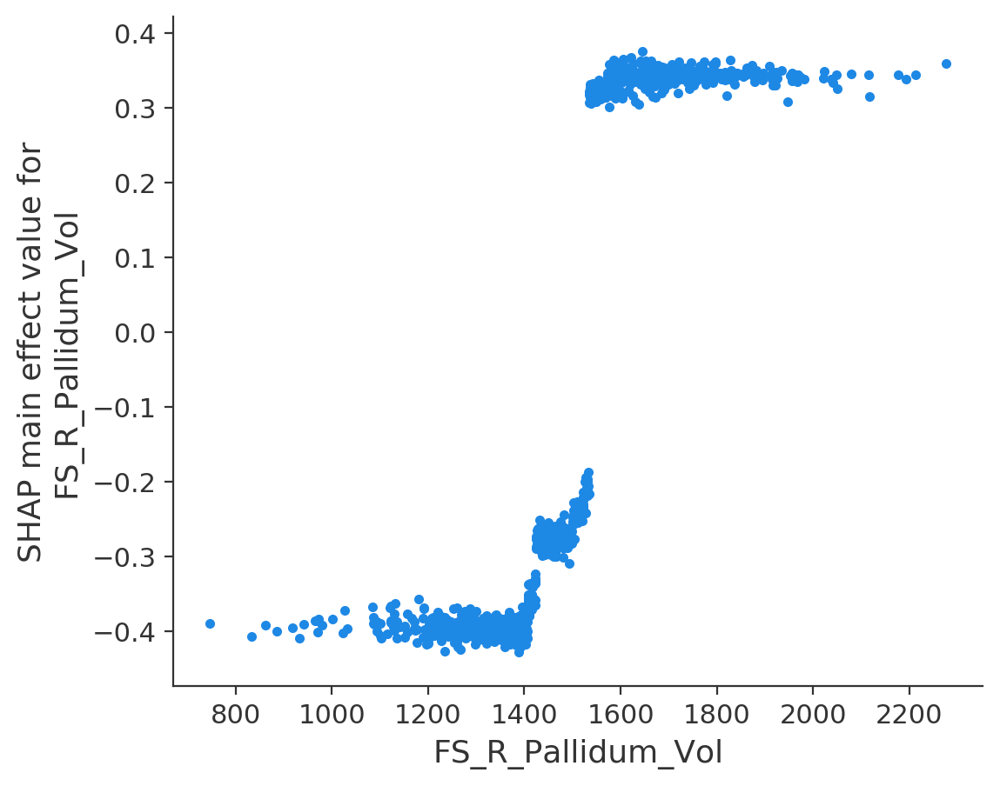

...

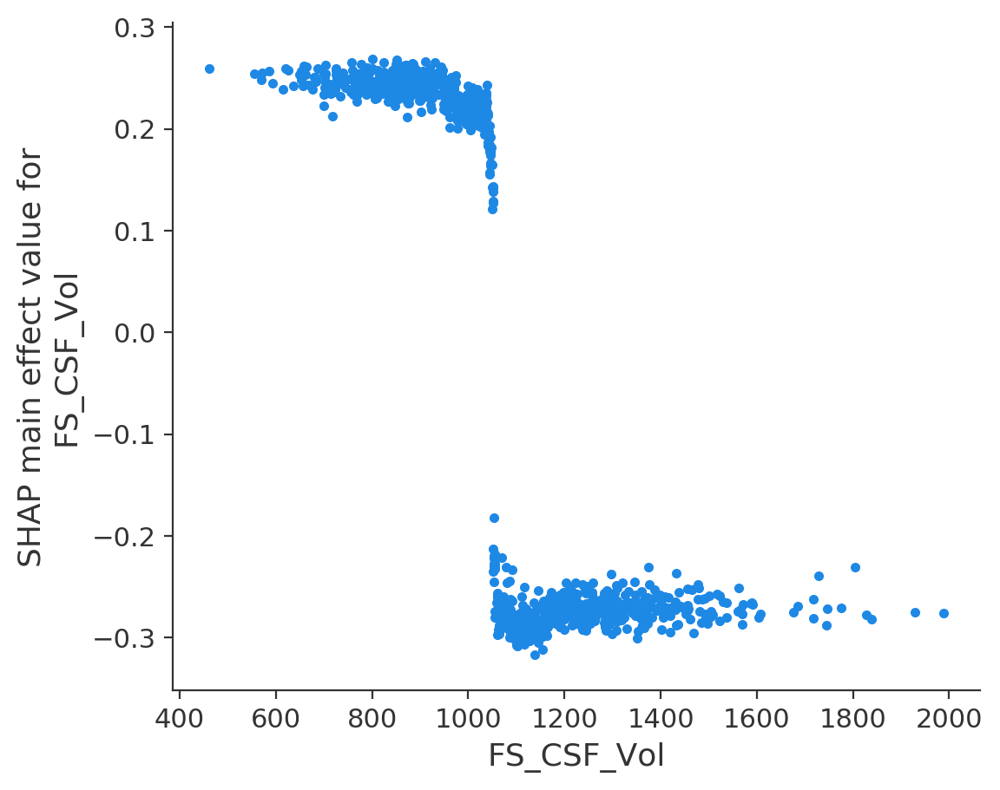

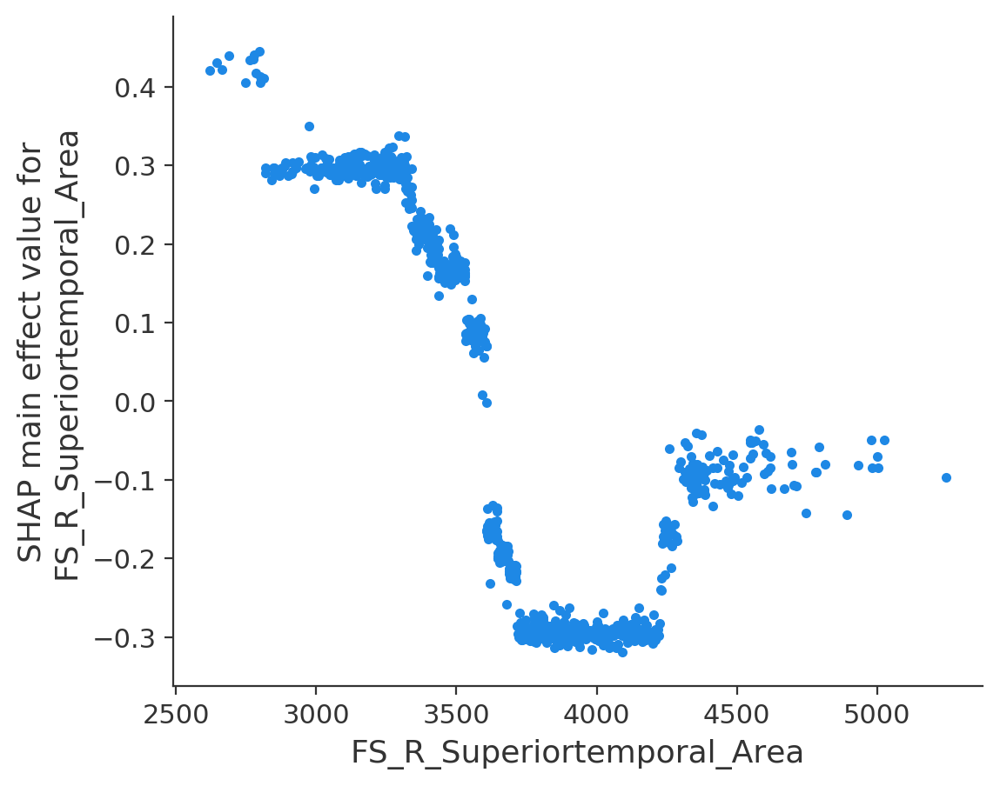

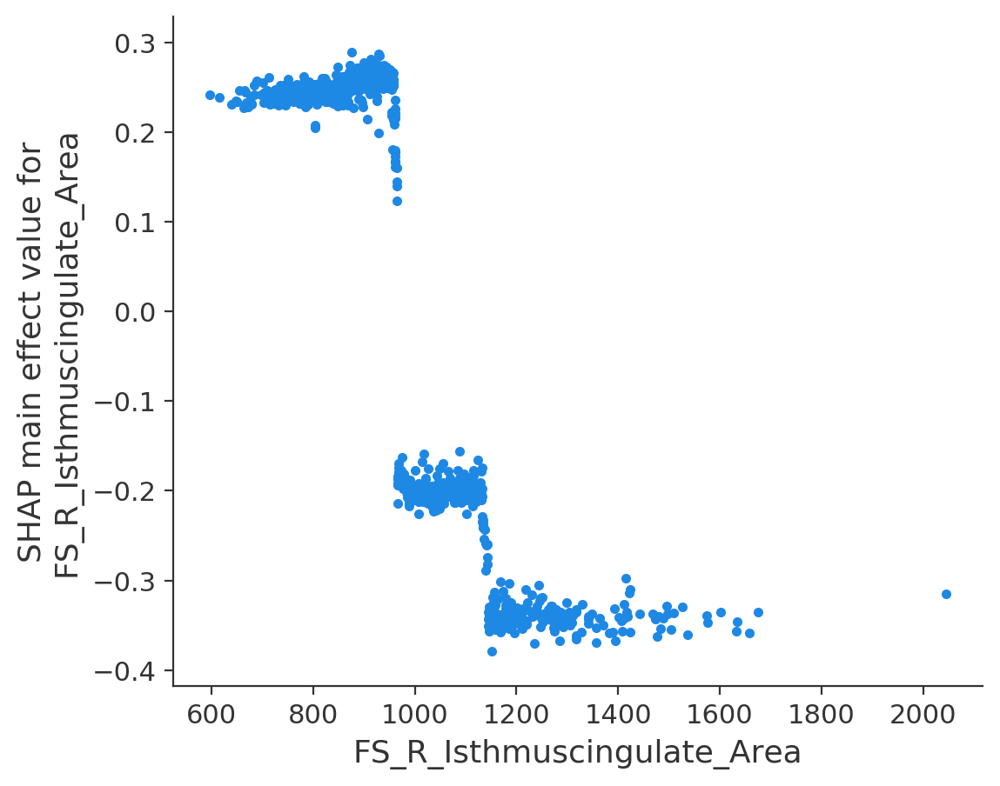

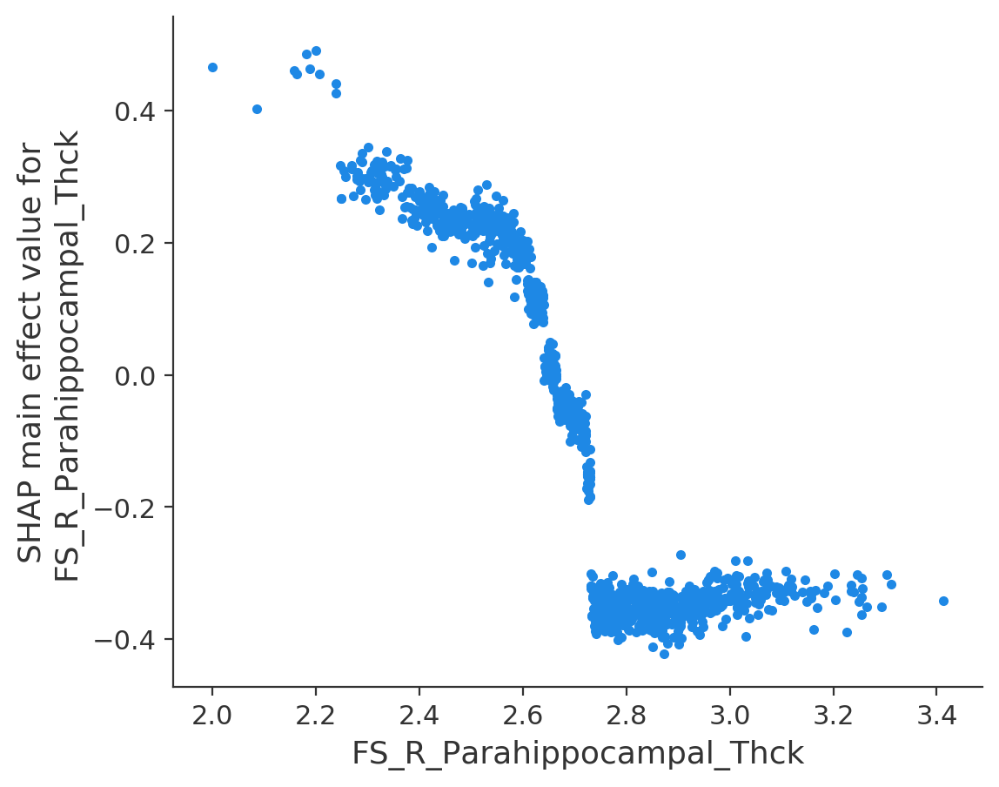

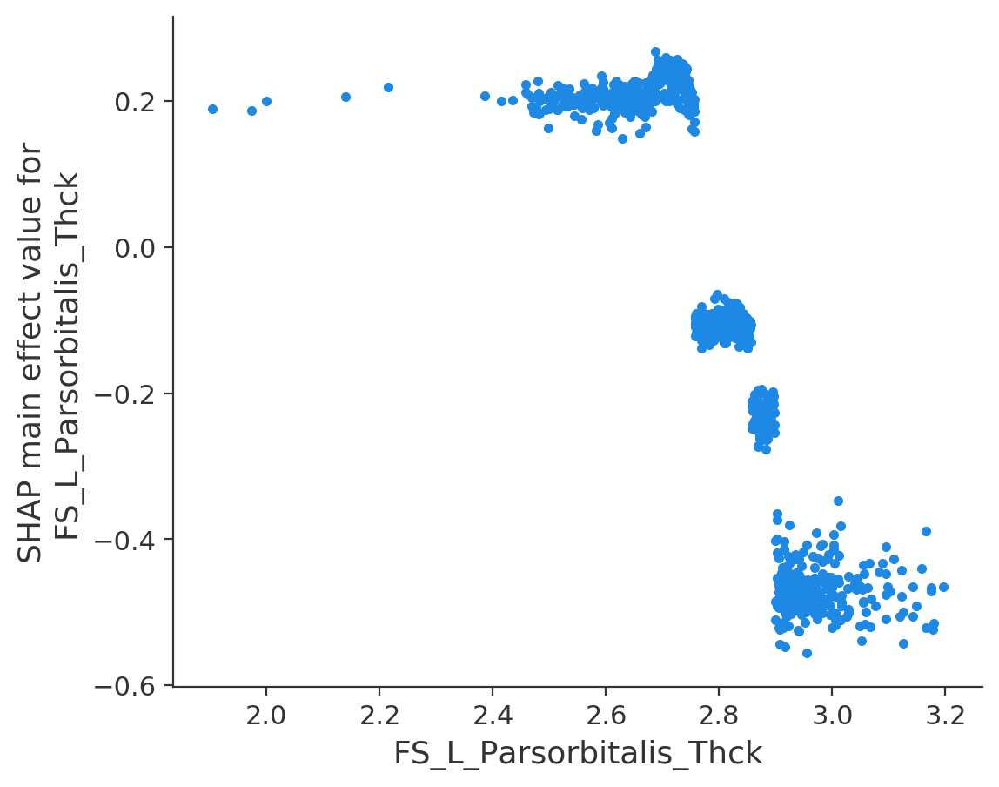

In [17]:
for i in range(20):
    shap.dependence_plot(
        (top_inds[i], top_inds[i]),
        shap_interaction_values, 
        X
    )

# SHAP interaction value plots
# top 20

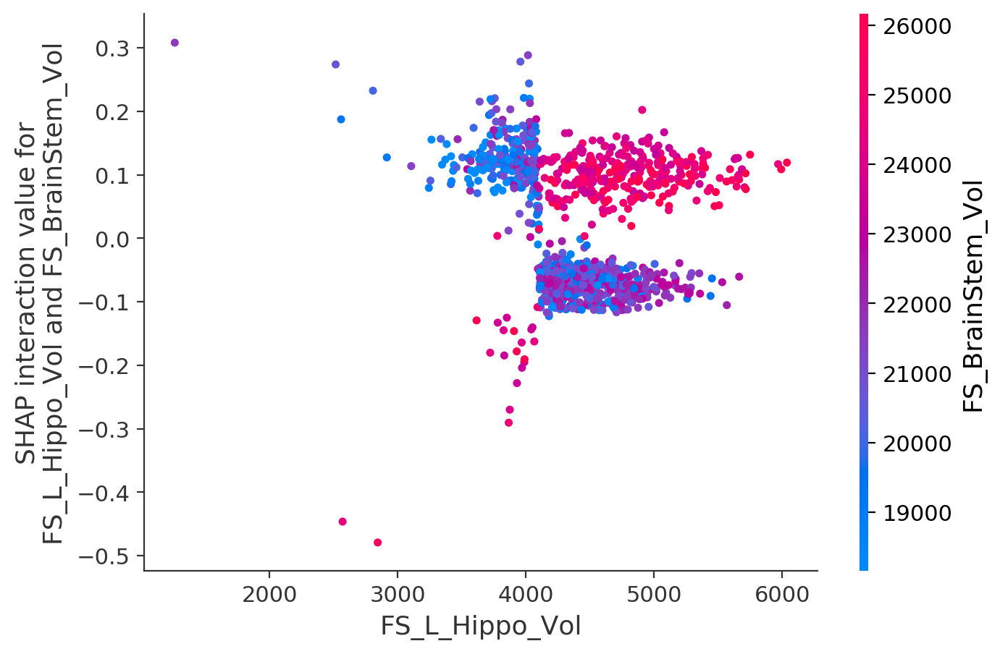

In [18]:
shap.dependence_plot(
    ('FS_L_Hippo_Vol', 'FS_BrainStem_Vol'),
    shap_interaction_values, 
    X
)

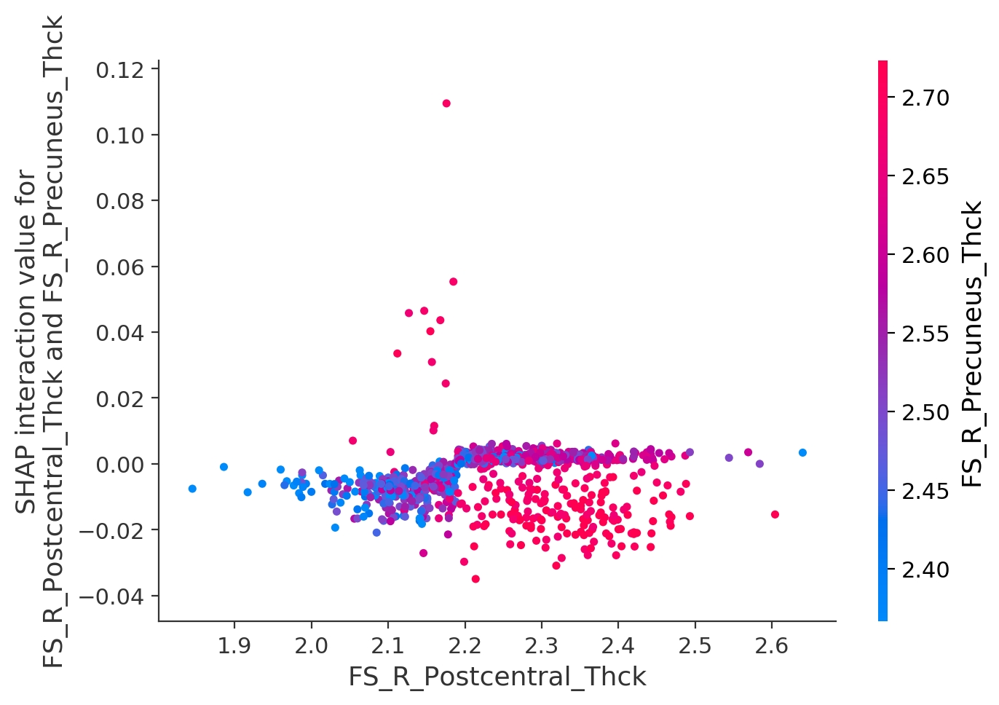

In [19]:
shap.dependence_plot(
    ('FS_R_Postcentral_Thck', 'FS_R_Precuneus_Thck'),
    shap_interaction_values, 
    X
)

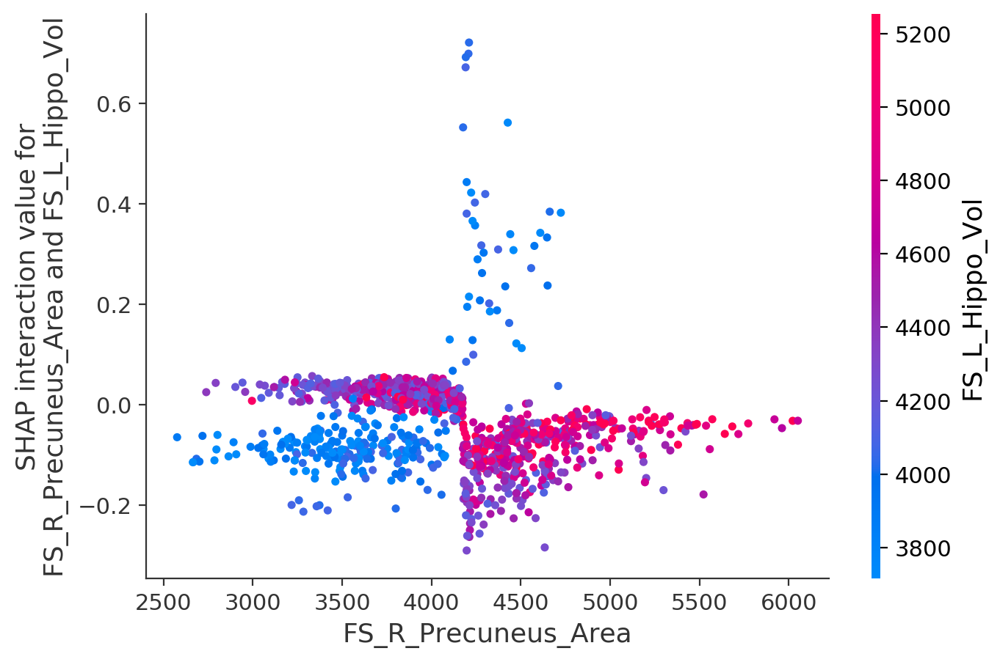

In [20]:
shap.dependence_plot(
    ('FS_R_Precuneus_Area', 'FS_L_Hippo_Vol'),
    shap_interaction_values, 
    X
)

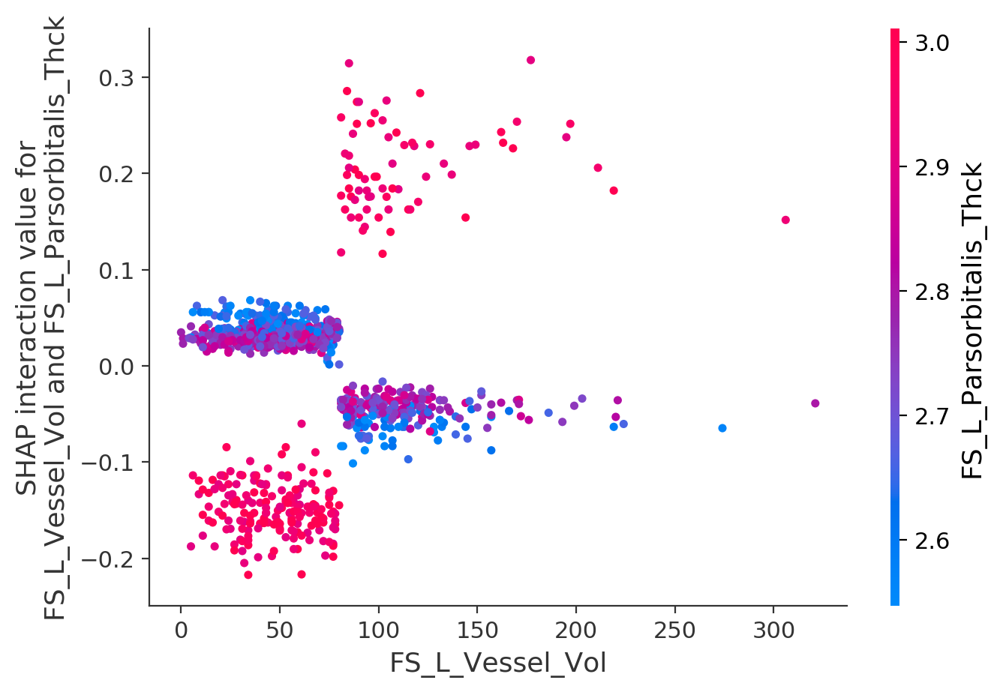

In [22]:
shap.dependence_plot(
    ('FS_L_Vessel_Vol', 'FS_L_Parsorbitalis_Thck'),
    shap_interaction_values, 
    X
)

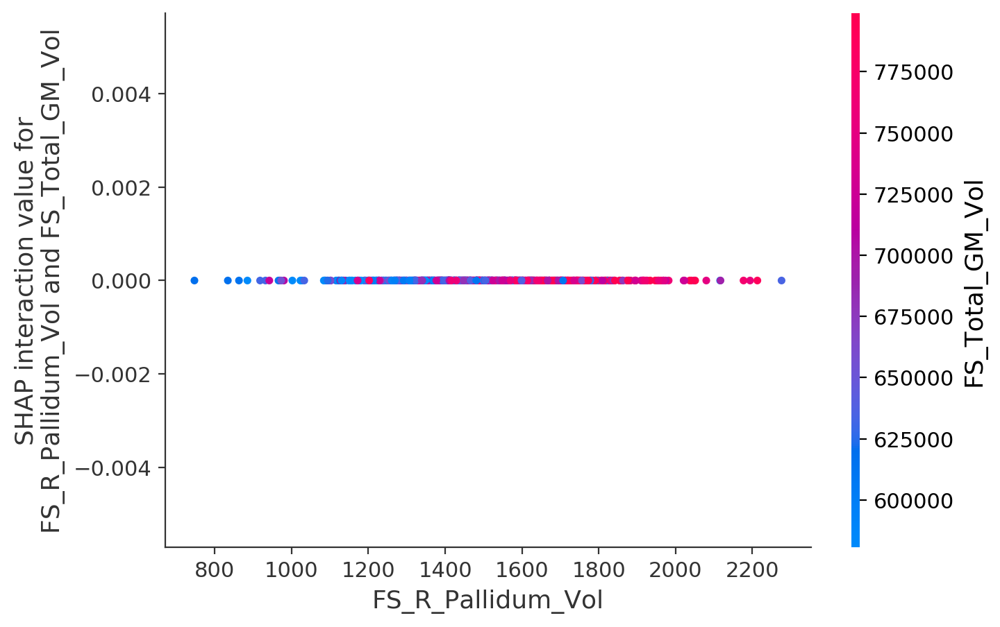

In [23]:
shap.dependence_plot(
    ('FS_R_Pallidum_Vol', 'FS_Total_GM_Vol'),
    shap_interaction_values, 
    X
)

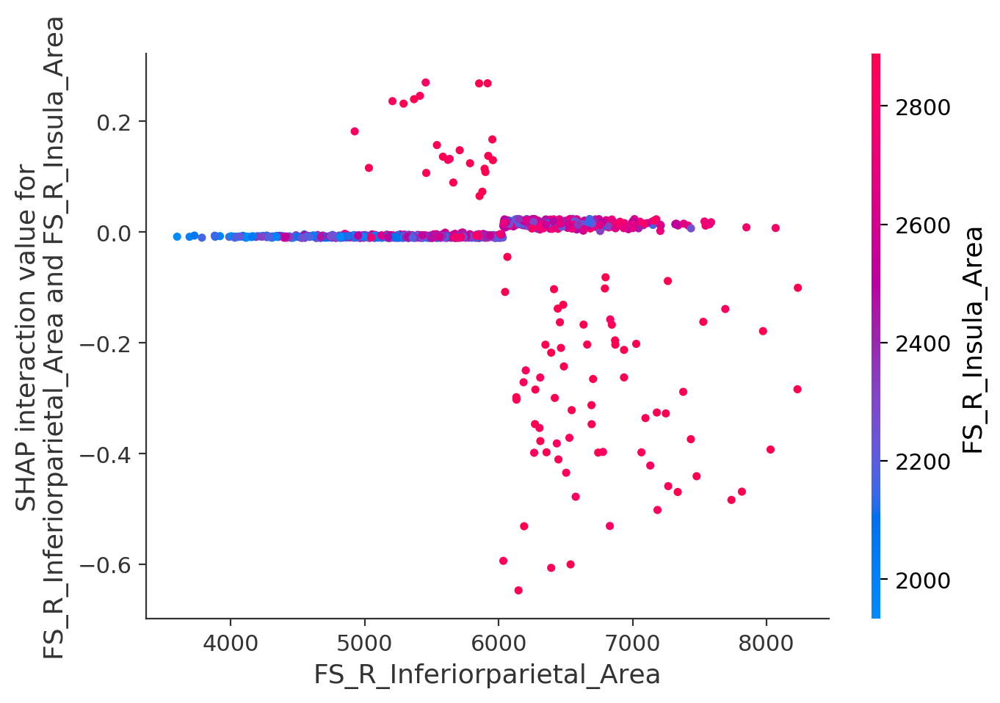

In [24]:
shap.dependence_plot(
    ('FS_R_Inferiorparietal_Area', 'FS_R_Insula_Area'),
    shap_interaction_values, 
    X
)

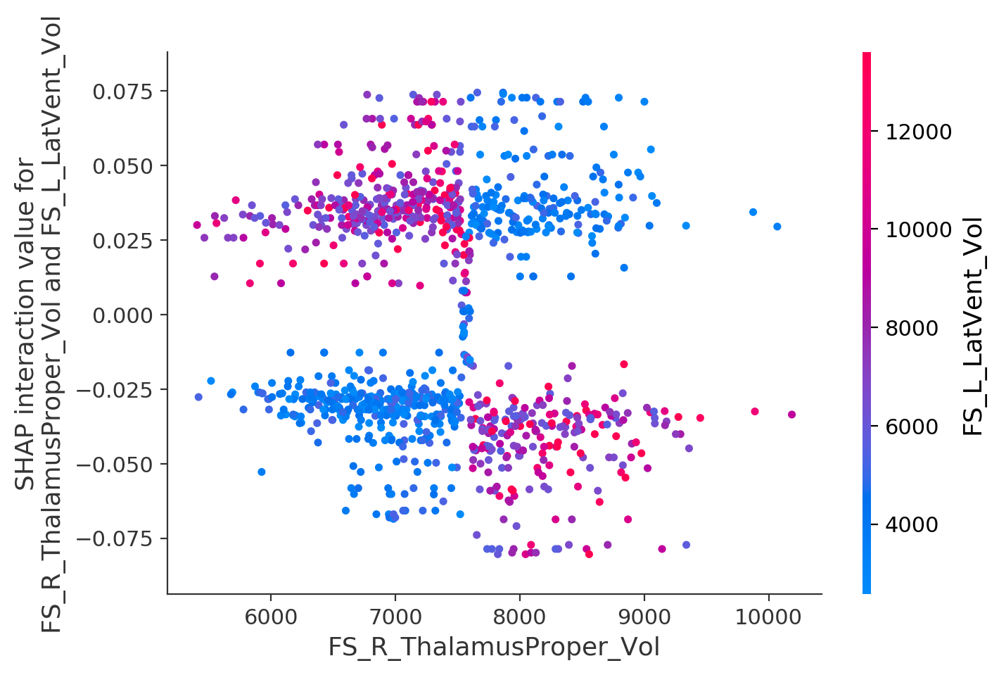

In [26]:
shap.dependence_plot(
    ('FS_R_ThalamusProper_Vol', 'FS_L_LatVent_Vol'),
    shap_interaction_values, 
    X
)

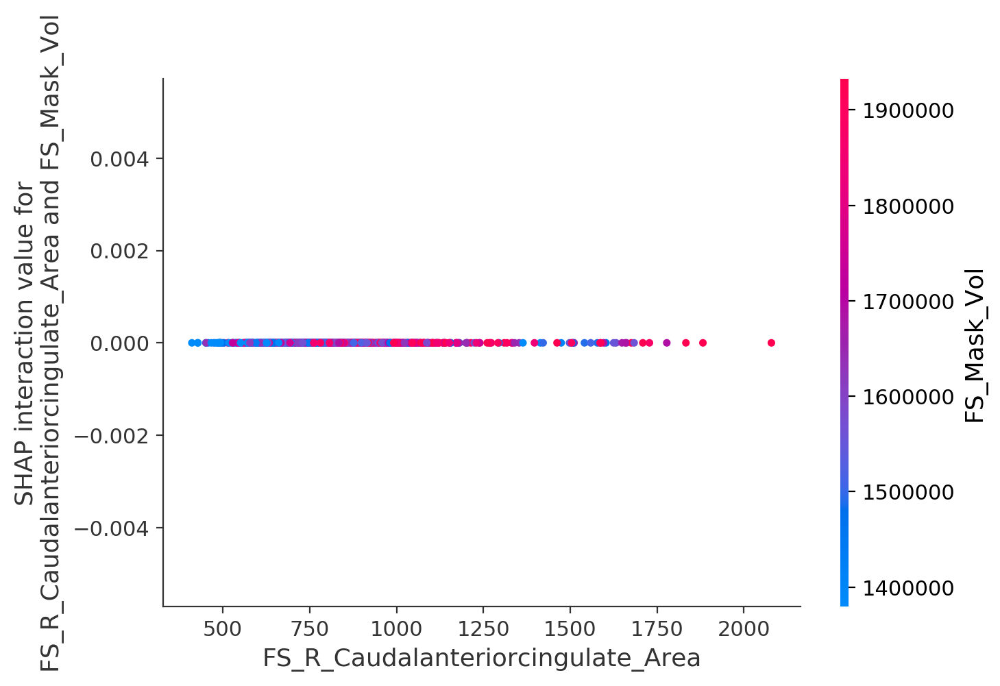

In [27]:
shap.dependence_plot(
    ('FS_R_Caudalanteriorcingulate_Area', 'FS_Mask_Vol'),
    shap_interaction_values, 
    X
)

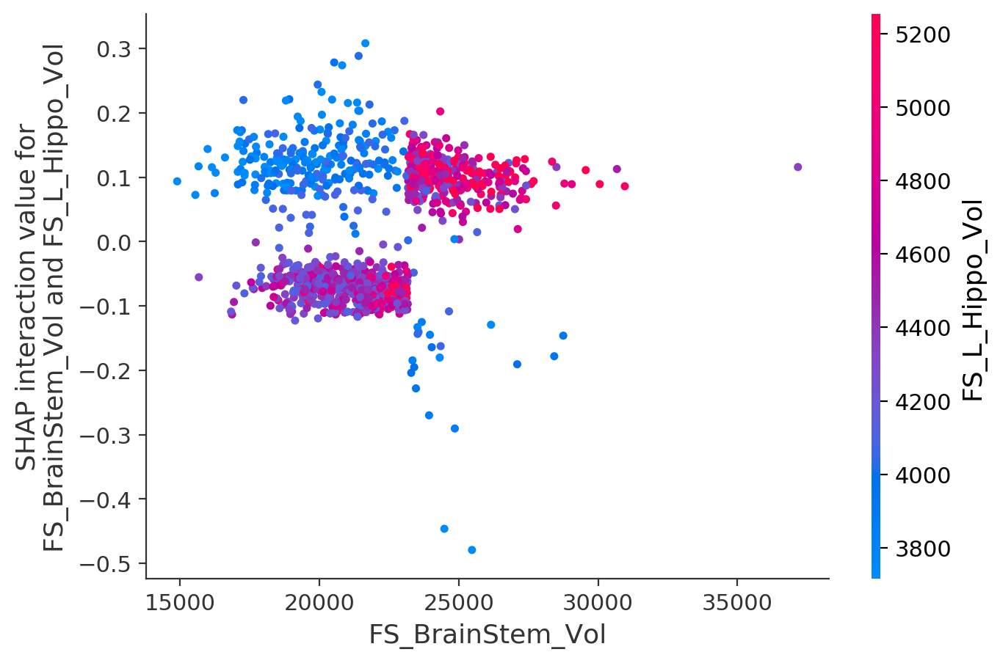

In [28]:
shap.dependence_plot(
    ('FS_BrainStem_Vol', 'FS_L_Hippo_Vol'),
    shap_interaction_values, 
    X
)

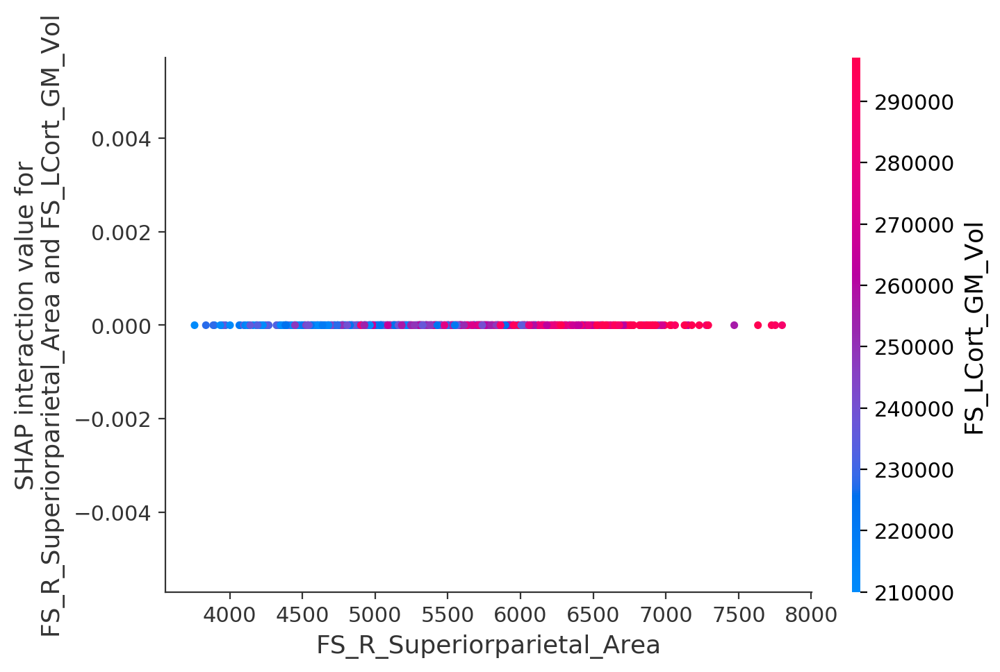

In [29]:
shap.dependence_plot(
    ('FS_R_Superiorparietal_Area', 'FS_LCort_GM_Vol'),
    shap_interaction_values, 
    X
)

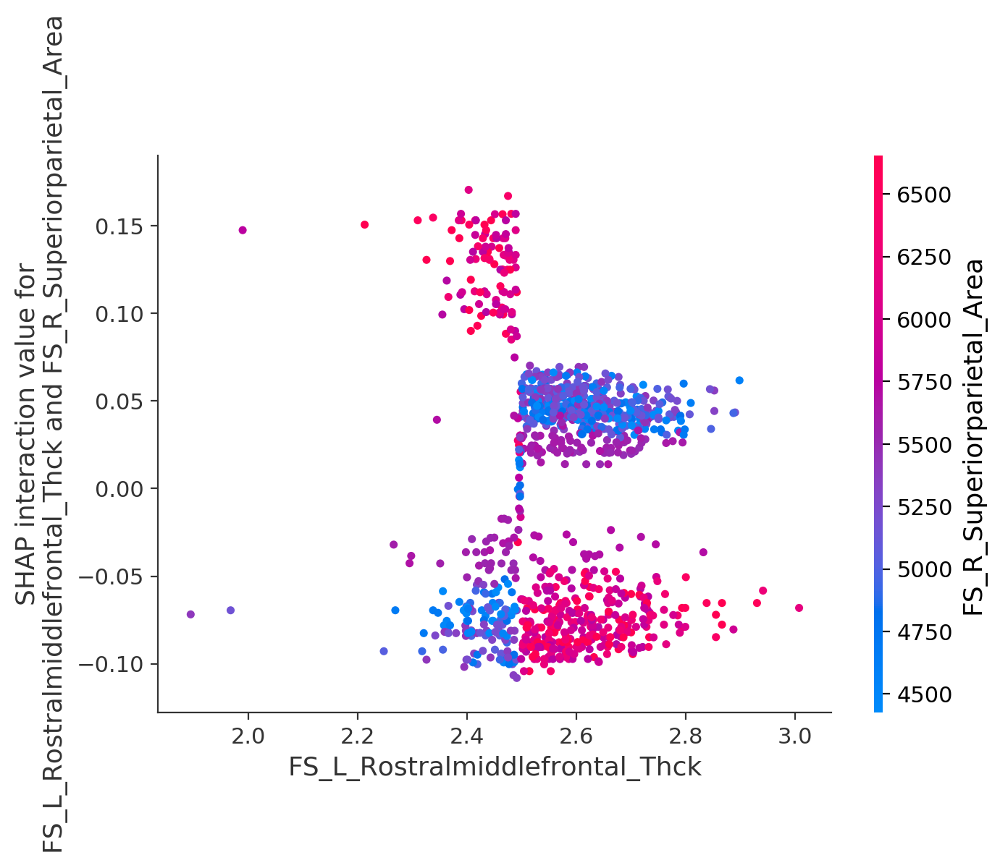

In [30]:
shap.dependence_plot(
    ('FS_L_Rostralmiddlefrontal_Thck', 'FS_R_Superiorparietal_Area'),
    shap_interaction_values, 
    X
)

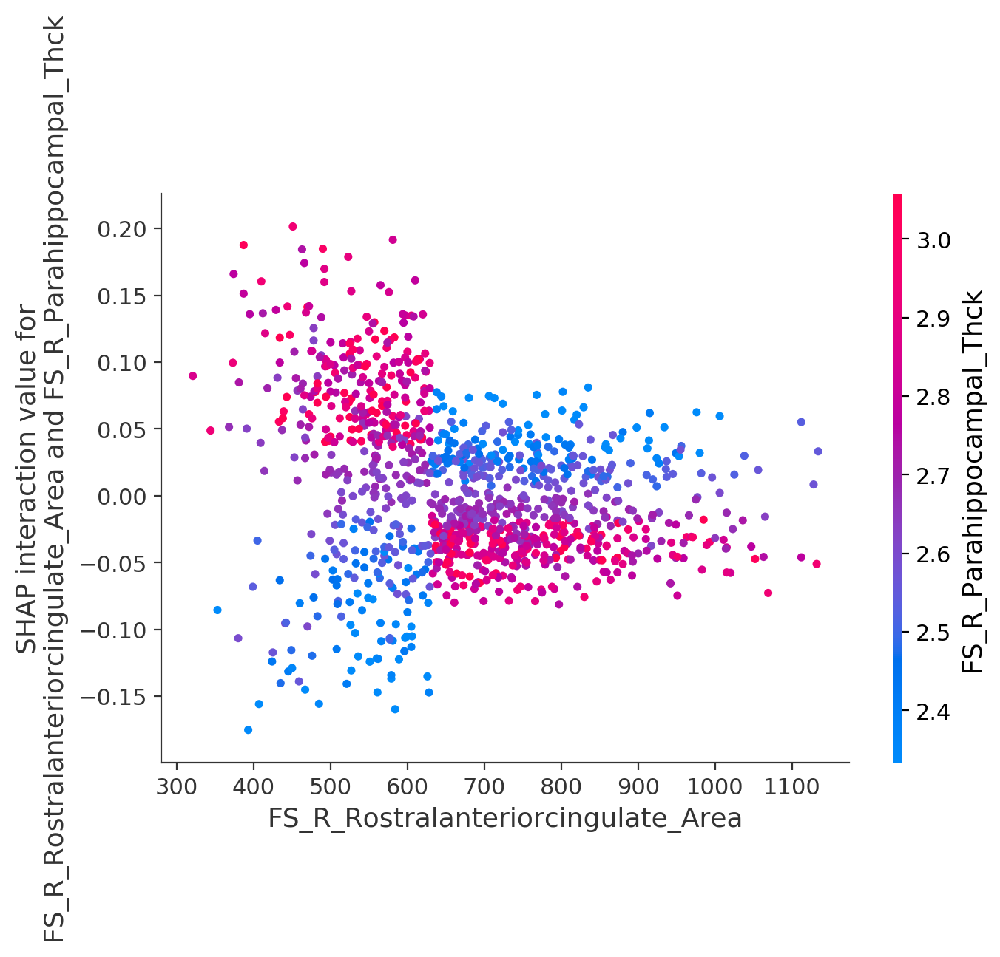

In [32]:
shap.dependence_plot(
    ('FS_R_Rostralanteriorcingulate_Area', 'FS_R_Parahippocampal_Thck'),
    shap_interaction_values, 
    X
)

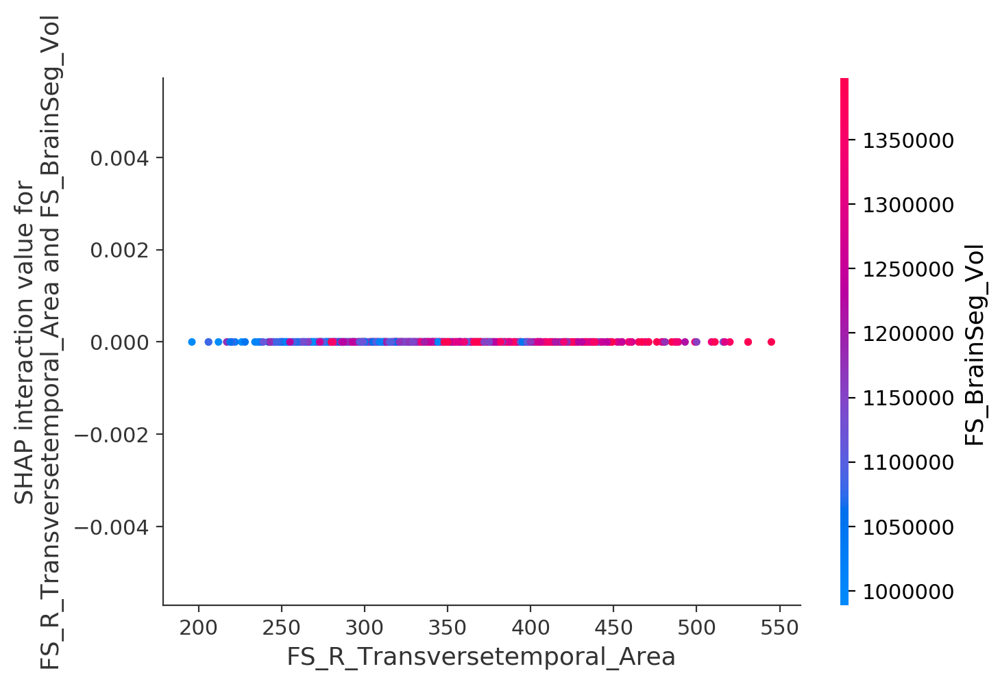

In [33]:
shap.dependence_plot(
    ('FS_R_Transversetemporal_Area', 'FS_BrainSeg_Vol'),
    shap_interaction_values, 
    X
)

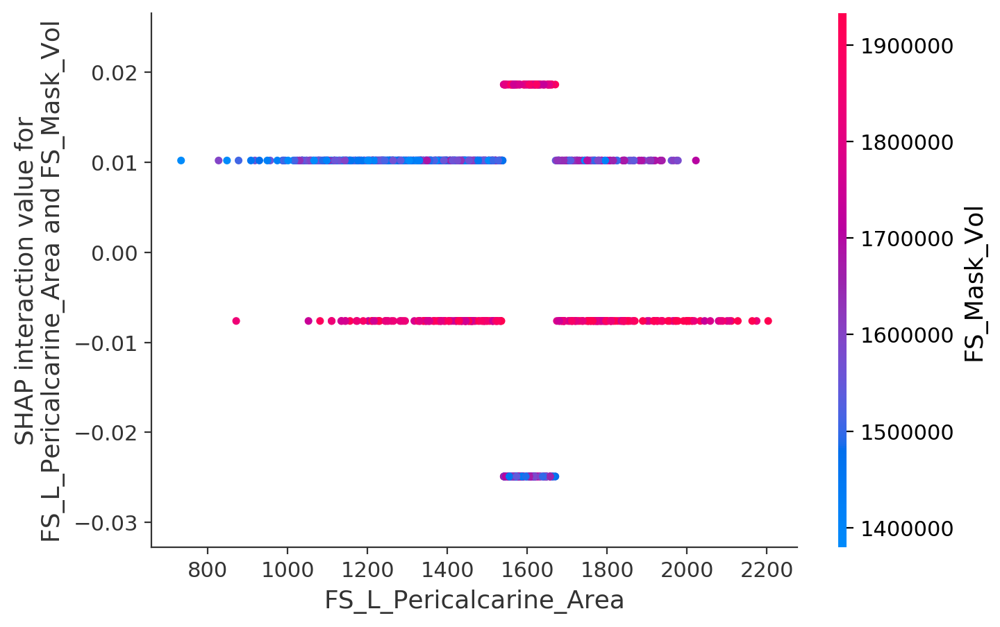

In [34]:
shap.dependence_plot(
    ('FS_L_Pericalcarine_Area', 'FS_Mask_Vol'),
    shap_interaction_values, 
    X
)

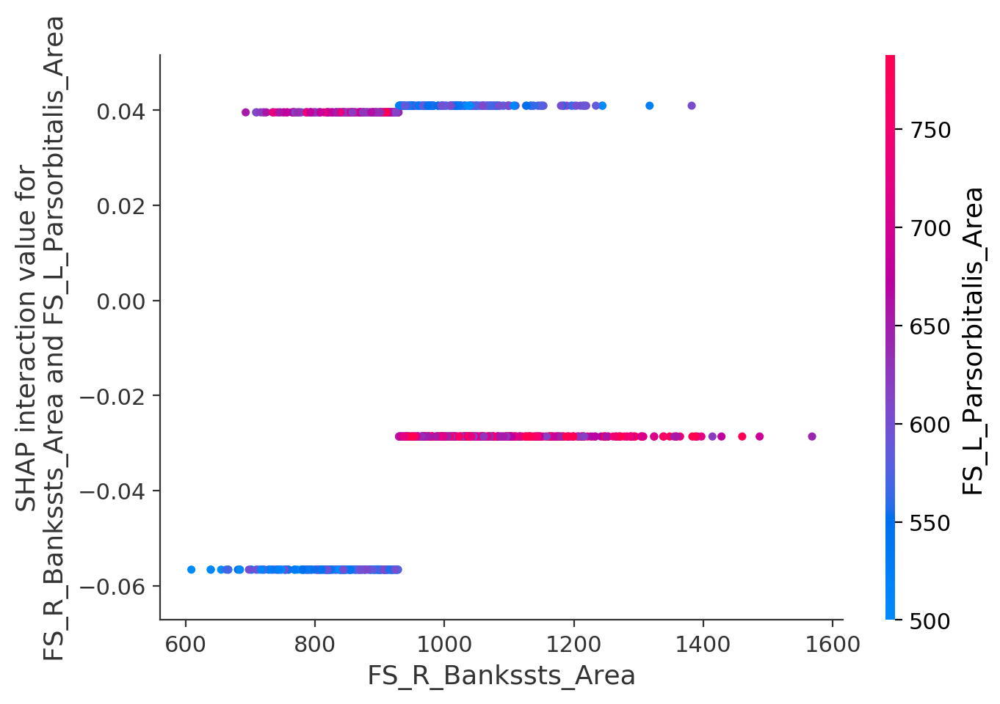

In [35]:
shap.dependence_plot(
    ('FS_R_Bankssts_Area', 'FS_L_Parsorbitalis_Area'),
    shap_interaction_values, 
    X
)

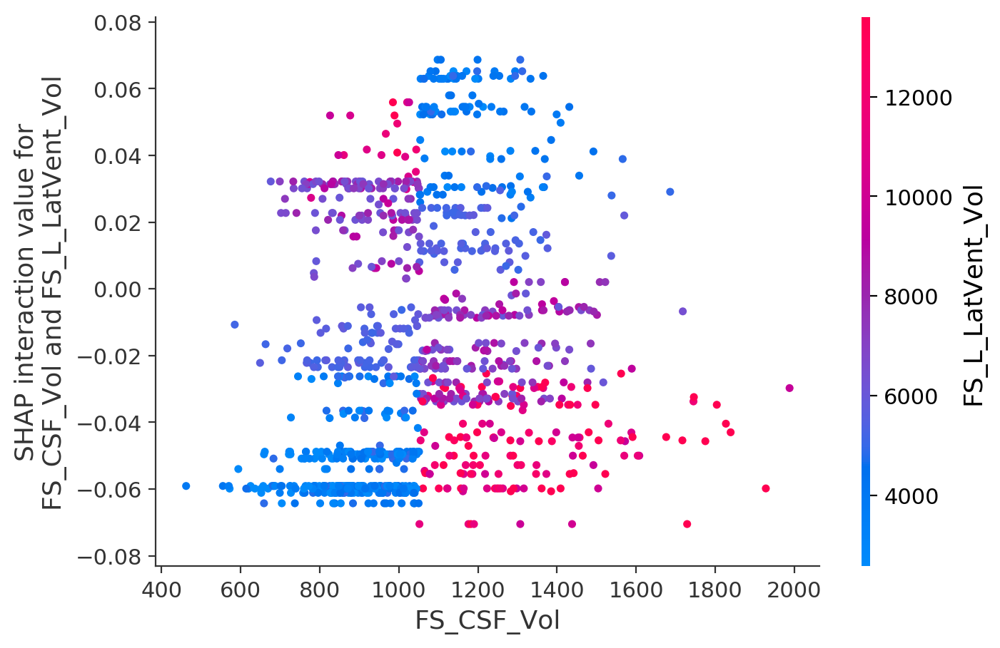

In [36]:
shap.dependence_plot(
    ('FS_CSF_Vol', 'FS_L_LatVent_Vol'),
    shap_interaction_values, 
    X
)

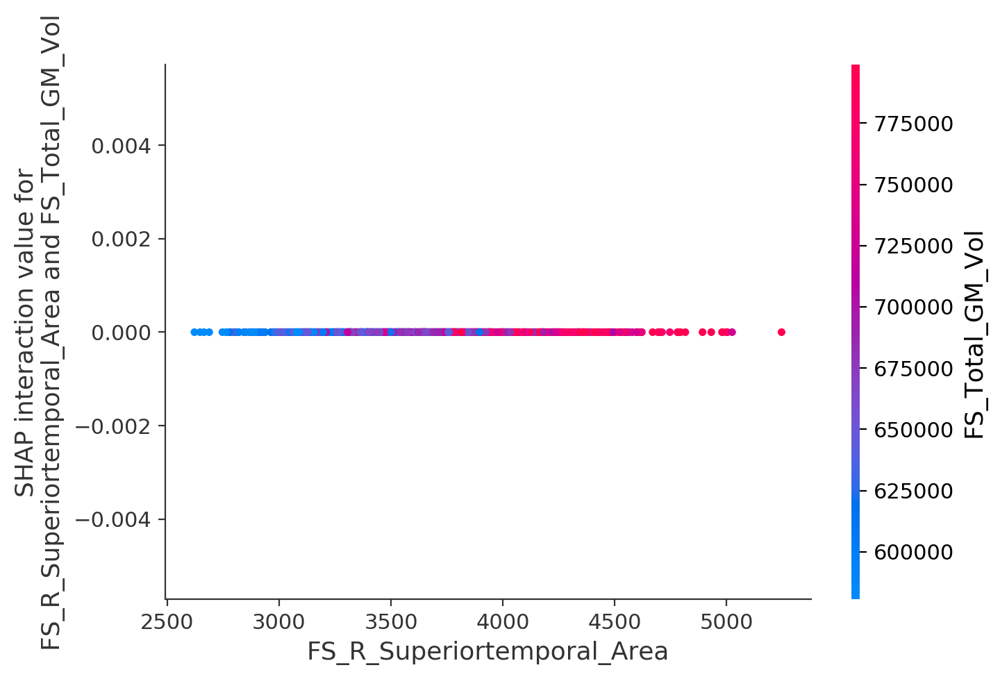

In [37]:
shap.dependence_plot(
    ('FS_R_Superiortemporal_Area', 'FS_Total_GM_Vol'),
    shap_interaction_values, 
    X
)

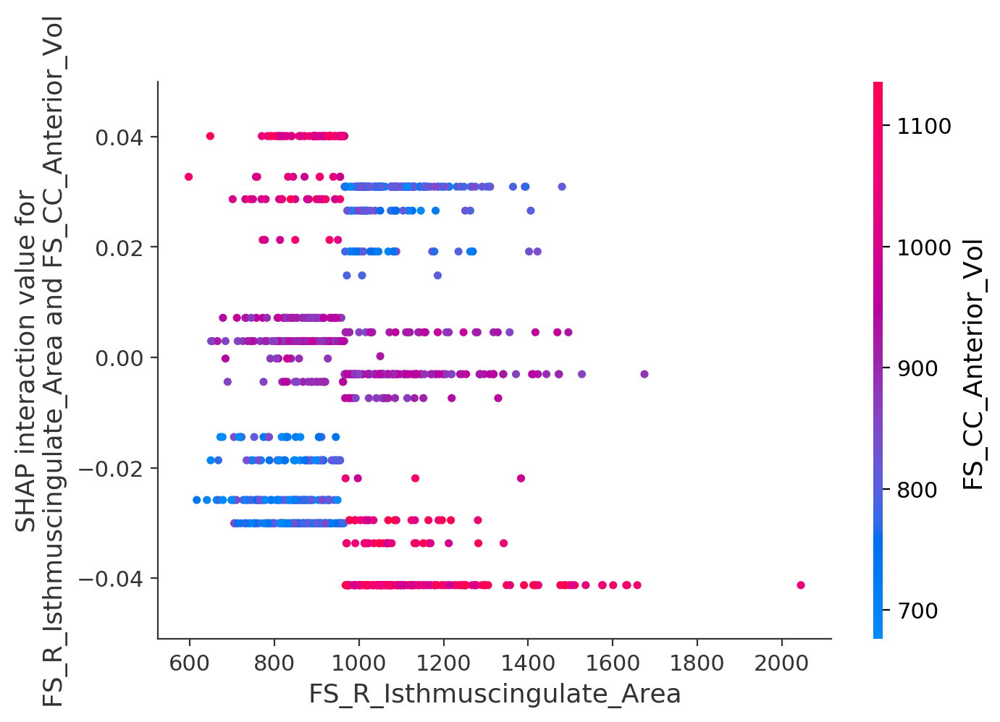

In [38]:
shap.dependence_plot(
    ('FS_R_Isthmuscingulate_Area', 'FS_CC_Anterior_Vol'),
    shap_interaction_values, 
    X
)

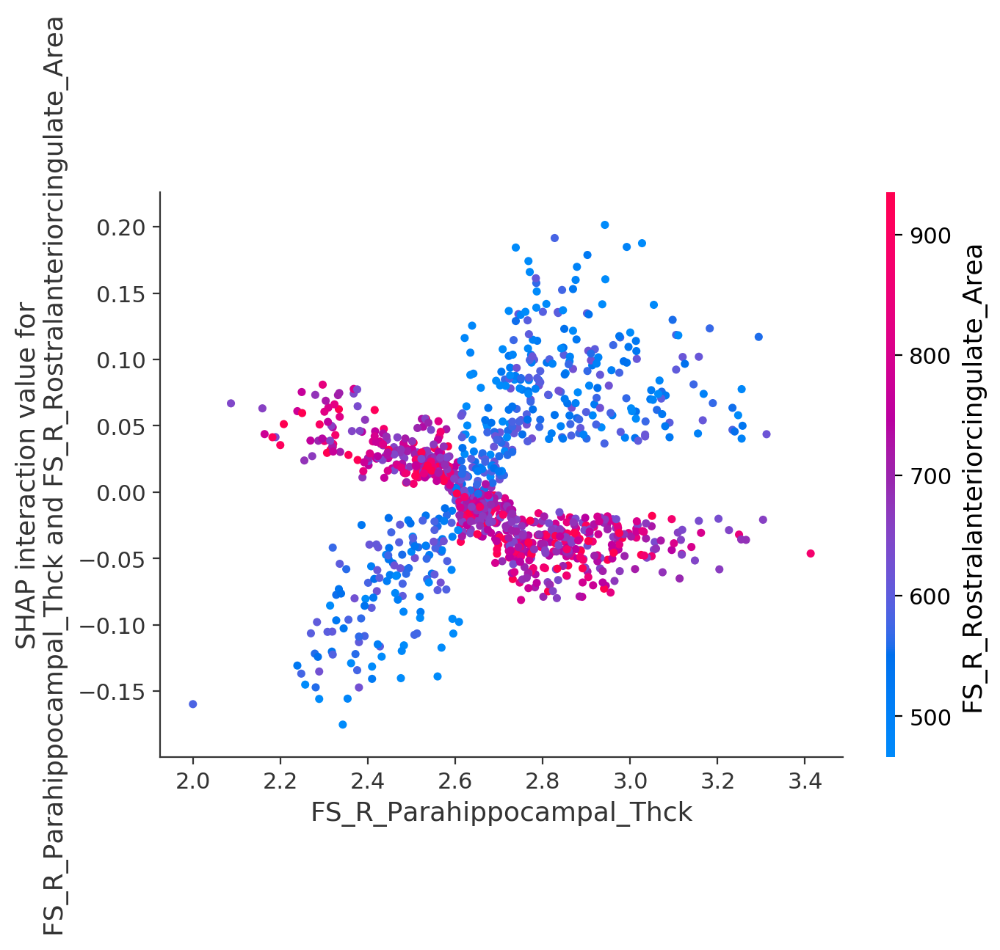

In [39]:
shap.dependence_plot(
    ('FS_R_Parahippocampal_Thck', 'FS_R_Rostralanteriorcingulate_Area'),
    shap_interaction_values, 
    X
)

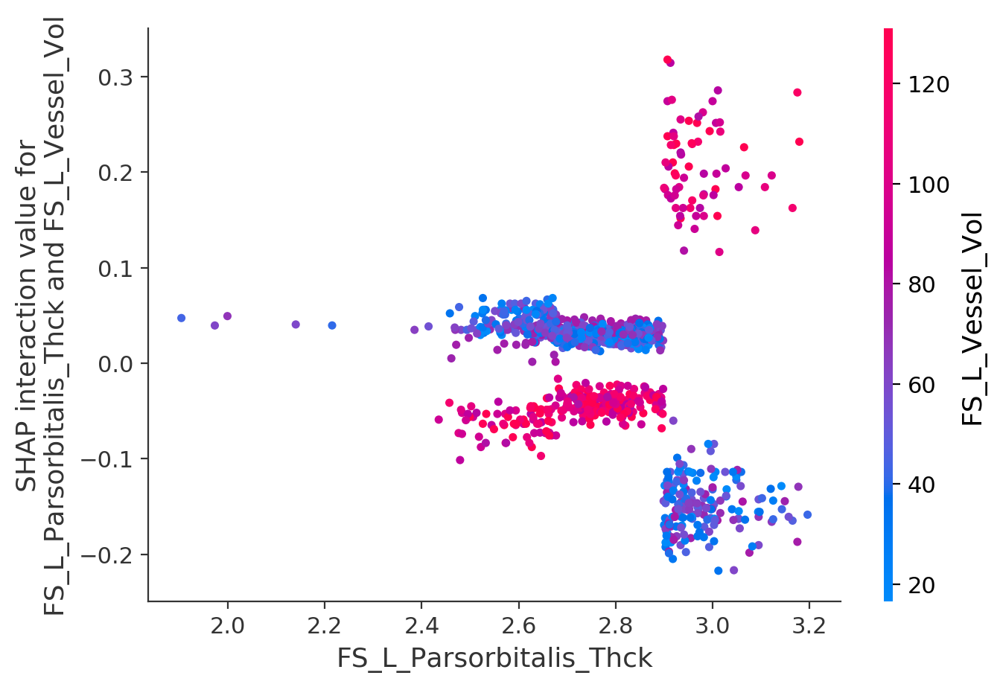

In [40]:
shap.dependence_plot(
    ('FS_L_Parsorbitalis_Thck', 'FS_L_Vessel_Vol'),
    shap_interaction_values, 
    X
)